# Q.Predict the Burned Area of Forest Fire with Neural Networks.

# Neural Networks

- **Neural Networks**- also known as **Artificial Neural Networks (ANNs)** or **Simulated Neural Networks (SNNs)**, are a subset of machine learning and are at the heart of deep learning algorithms. Their name and structure are inspired by the human brain, mimicking the way that biological neurons signal to one another.

- Artificial neural networks (ANNs) are comprised of a node layers, containing an input layer, one or more hidden layers, and an output layer. Each node, or artificial neuron, connects to another and has an associated weight and threshold. If the output of any individual node is above the specified threshold value, that node is activated, sending data to the next layer of the network. Otherwise, no data is passed along to the next layer of the network.
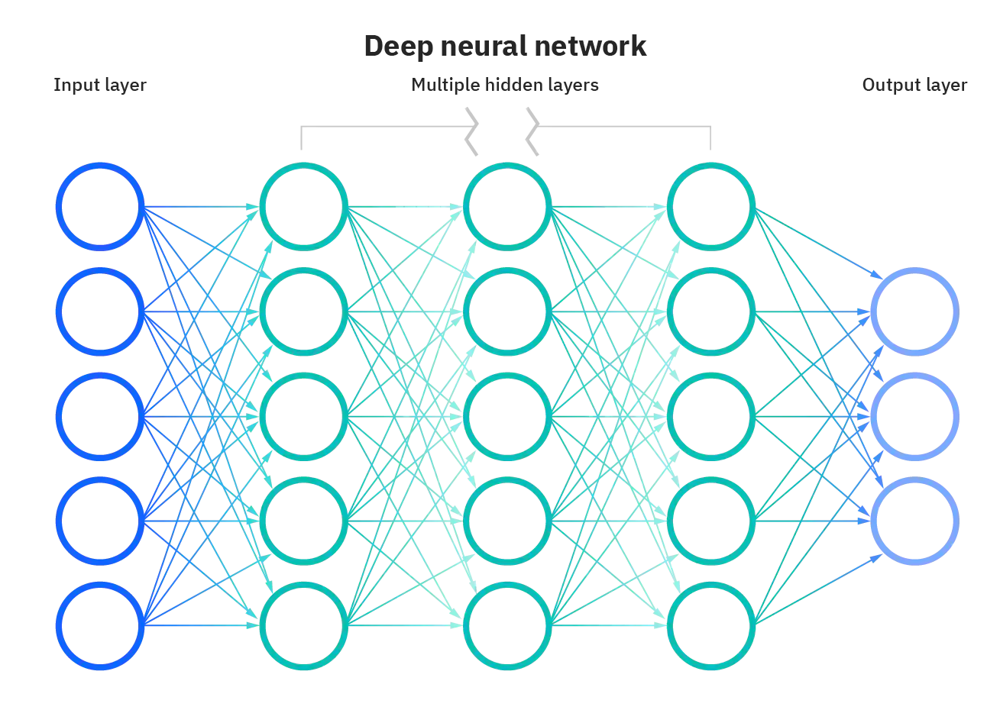

### Importing Libraries

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt 
import seaborn as sns
import plotly.express as px
import warnings
warnings.filterwarnings('ignore')

### Importing dataset

In [2]:
forest=pd.read_csv('forestfires.csv')

## Exploratory Data Analysis (EDA)

In [3]:
forest.head()

,month,day,FFMC,DMC,DC,ISI,temp,RH,wind,rain,...,monthfeb,monthjan,monthjul,monthjun,monthmar,monthmay,monthnov,monthoct,monthsep,size_category
0,mar,fri,86.2,26.2,94.3,5.1,8.2,51,6.7,0.0,...,0,0,0,0,1,0,0,0,0,small
1,oct,tue,90.6,35.4,669.1,6.7,18.0,33,0.9,0.0,...,0,0,0,0,0,0,0,1,0,small
2,oct,sat,90.6,43.7,686.9,6.7,14.6,33,1.3,0.0,...,0,0,0,0,0,0,0,1,0,small
3,mar,fri,91.7,33.3,77.5,9.0,8.3,97,4.0,0.2,...,0,0,0,0,1,0,0,0,0,small
4,mar,sun,89.3,51.3,102.2,9.6,11.4,99,1.8,0.0,...,0,0,0,0,1,0,0,0,0,small


In [4]:
forest.tail()

,month,day,FFMC,DMC,DC,ISI,temp,RH,wind,rain,...,monthfeb,monthjan,monthjul,monthjun,monthmar,monthmay,monthnov,monthoct,monthsep,size_category
512,aug,sun,81.6,56.7,665.6,1.9,27.8,32,2.7,0.0,...,0,0,0,0,0,0,0,0,0,large
513,aug,sun,81.6,56.7,665.6,1.9,21.9,71,5.8,0.0,...,0,0,0,0,0,0,0,0,0,large
514,aug,sun,81.6,56.7,665.6,1.9,21.2,70,6.7,0.0,...,0,0,0,0,0,0,0,0,0,large
515,aug,sat,94.4,146.0,614.7,11.3,25.6,42,4.0,0.0,...,0,0,0,0,0,0,0,0,0,small
516,nov,tue,79.5,3.0,106.7,1.1,11.8,31,4.5,0.0,...,0,0,0,0,0,0,1,0,0,small


In [5]:
forest.shape   

(517, 31)

Dataset has `517` rows and `31` columns

In [6]:
forest.columns

Index(['month', 'day', 'FFMC', 'DMC', 'DC', 'ISI', 'temp', 'RH', 'wind',
       'rain', 'area', 'dayfri', 'daymon', 'daysat', 'daysun', 'daythu',
       'daytue', 'daywed', 'monthapr', 'monthaug', 'monthdec', 'monthfeb',
       'monthjan', 'monthjul', 'monthjun', 'monthmar', 'monthmay', 'monthnov',
       'monthoct', 'monthsep', 'size_category'],
      dtype='object')

In [7]:
#Creating copy of original dataset so if we made any changes it won't effect our original datset
ff_data = forest.copy()

In [8]:
ff_data

,month,day,FFMC,DMC,DC,ISI,temp,RH,wind,rain,...,monthfeb,monthjan,monthjul,monthjun,monthmar,monthmay,monthnov,monthoct,monthsep,size_category
0,mar,fri,86.2,26.2,94.3,5.1,8.2,51,6.7,0.0,...,0,0,0,0,1,0,0,0,0,small
1,oct,tue,90.6,35.4,669.1,6.7,18.0,33,0.9,0.0,...,0,0,0,0,0,0,0,1,0,small
2,oct,sat,90.6,43.7,686.9,6.7,14.6,33,1.3,0.0,...,0,0,0,0,0,0,0,1,0,small
3,mar,fri,91.7,33.3,77.5,9.0,8.3,97,4.0,0.2,...,0,0,0,0,1,0,0,0,0,small
4,mar,sun,89.3,51.3,102.2,9.6,11.4,99,1.8,0.0,...,0,0,0,0,1,0,0,0,0,small
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
512,aug,sun,81.6,56.7,665.6,1.9,27.8,32,2.7,0.0,...,0,0,0,0,0,0,0,0,0,large
513,aug,sun,81.6,56.7,665.6,1.9,21.9,71,5.8,0.0,...,0,0,0,0,0,0,0,0,0,large
514,aug,sun,81.6,56.7,665.6,1.9,21.2,70,6.7,0.0,...,0,0,0,0,0,0,0,0,0,large
515,aug,sat,94.4,146.0,614.7,11.3,25.6,42,4.0,0.0,...,0,0,0,0,0,0,0,0,0,small


In [9]:
ff_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 517 entries, 0 to 516
Data columns (total 31 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   month          517 non-null    object 
 1   day            517 non-null    object 
 2   FFMC           517 non-null    float64
 3   DMC            517 non-null    float64
 4   DC             517 non-null    float64
 5   ISI            517 non-null    float64
 6   temp           517 non-null    float64
 7   RH             517 non-null    int64  
 8   wind           517 non-null    float64
 9   rain           517 non-null    float64
 10  area           517 non-null    float64
 11  dayfri         517 non-null    int64  
 12  daymon         517 non-null    int64  
 13  daysat         517 non-null    int64  
 14  daysun         517 non-null    int64  
 15  daythu         517 non-null    int64  
 16  daytue         517 non-null    int64  
 17  daywed         517 non-null    int64  
 18  monthapr  

### Descriptive Analysis

In [10]:
ff_data.describe().T

,count,mean,std,min,25%,50%,75%,max
FFMC,517.0,90.644681,5.520111,18.7,90.2,91.60,92.90,96.20
DMC,517.0,110.872340,64.046482,1.1,68.6,108.30,142.40,291.30
DC,517.0,547.940039,248.066192,7.9,437.7,664.20,713.90,860.60
ISI,517.0,9.021663,4.559477,0.0,6.5,8.40,10.80,56.10
temp,517.0,18.889168,5.806625,2.2,15.5,19.30,22.80,33.30
RH,517.0,44.288201,16.317469,15.0,33.0,42.00,53.00,100.00
wind,517.0,4.017602,1.791653,0.4,2.7,4.00,4.90,9.40
rain,517.0,0.021663,0.295959,0.0,0.0,0.00,0.00,6.40
area,517.0,12.847292,63.655818,0.0,0.0,0.52,6.57,1090.84
dayfri,517.0,0.164410,0.371006,0.0,0.0,0.00,0.00,1.00


In [11]:
ff_data.ndim

2

In [12]:
ff_data.axes

[RangeIndex(start=0, stop=517, step=1),
 Index(['month', 'day', 'FFMC', 'DMC', 'DC', 'ISI', 'temp', 'RH', 'wind',
        'rain', 'area', 'dayfri', 'daymon', 'daysat', 'daysun', 'daythu',
        'daytue', 'daywed', 'monthapr', 'monthaug', 'monthdec', 'monthfeb',
        'monthjan', 'monthjul', 'monthjun', 'monthmar', 'monthmay', 'monthnov',
        'monthoct', 'monthsep', 'size_category'],
       dtype='object')]

#### axes is a function of the matplotlib library that adds axes to the current graph and makes it as current axes.

### Unique Values

In [13]:
ff_data.nunique()

month             12
day                7
FFMC             106
DMC              215
DC               219
ISI              119
temp             192
RH                75
wind              21
rain               7
area             251
dayfri             2
daymon             2
daysat             2
daysun             2
daythu             2
daytue             2
daywed             2
monthapr           2
monthaug           2
monthdec           2
monthfeb           2
monthjan           2
monthjul           2
monthjun           2
monthmar           2
monthmay           2
monthnov           2
monthoct           2
monthsep           2
size_category      2
dtype: int64

## Data Visualization
### Pairplot

<Figure size 720x1080 with 0 Axes>

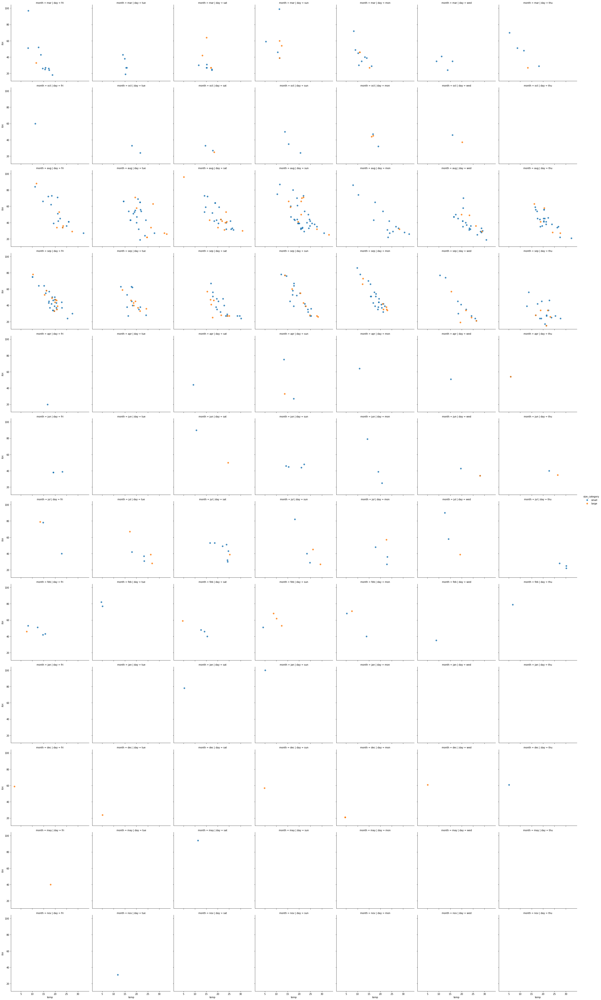

In [14]:
plt.figure(figsize=(10,15))
sns.lmplot(x='temp',y='RH',data=ff_data,hue='size_category' ,fit_reg=False,col='day',row='month')
plt.show()

### Observations:
1. As the temperature increases the RH got decrease
2. The more numbers of fire got in the months of March, August and September
3. In the month of March friday as the temperature is getting increases the Rh getting down and the fires contains small
4. The month of March has high rate of getting fires 
5. As looking to graph we can assume that as increase in the temperatures if RH aslo gets incresed there are less chances of getting fires 

## Exploded PieChart
### Large Fires vs Small Fires

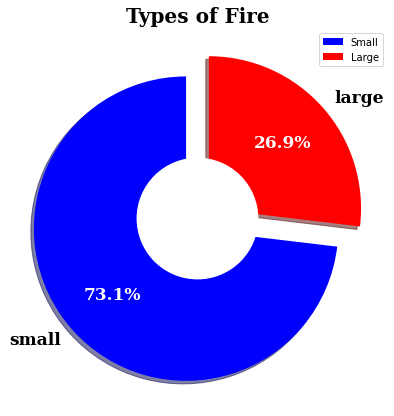

In [15]:
label_data=ff_data['size_category'].value_counts()

explode=(0.1,0.1)
plt.figure(figsize=(12,7))
patches, texts, pcts= plt.pie(label_data,labels=label_data.index,colors=['blue','red'],pctdistance=0.65,shadow=True,
                             startangle=90,explode=explode,autopct='%1.1f%%',
                             textprops={'fontsize':17,'color':'black','weight':'bold','family':'serif'})
plt.setp(pcts,color='white')
hfont={'weight':'bold','family':'serif'}
plt.title('Types of Fire',size=20,**hfont)

centre_circle=plt.Circle((0,0),0.40,fc='white')
fig=plt.gcf()
fig.gca().add_artist(centre_circle)
plt.legend(['Small','Large'],loc="upper right")
plt.show()

- ### Small fires took place more in numbers compared to large fires

### Barplot

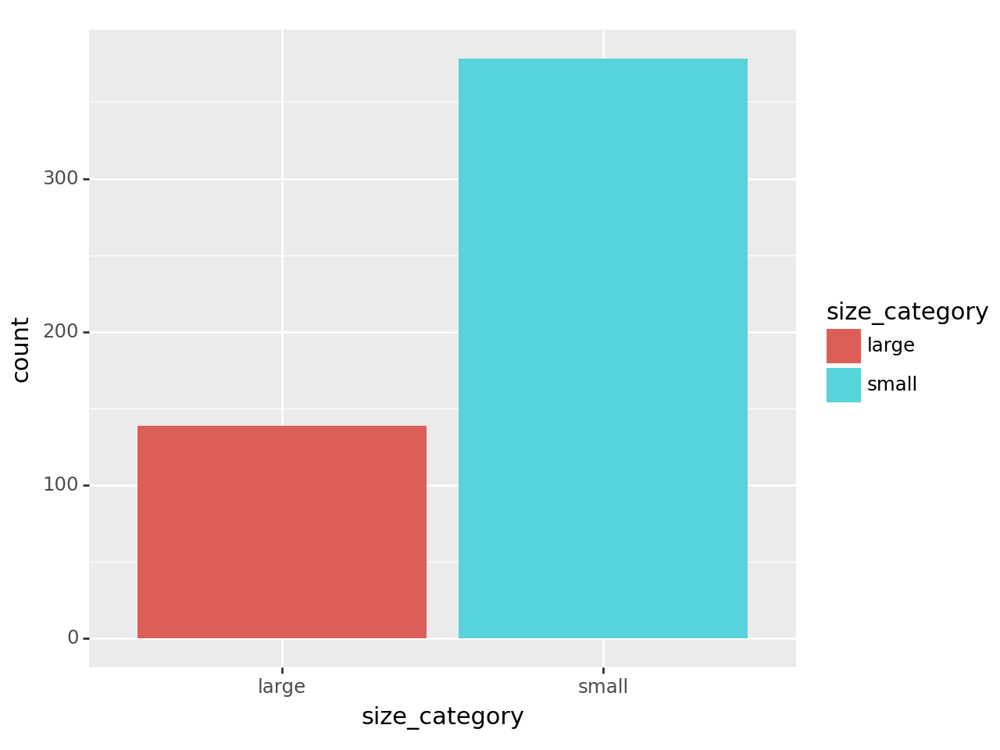

<Figure Size: (640 x 480)>

In [16]:
from plotnine.data import huron
from plotnine import ggplot, aes, stat_bin, geom_bar

ggplot(ff_data) + aes(x="size_category",fill='size_category') + geom_bar()

## Barchart
### For Scale of Fires

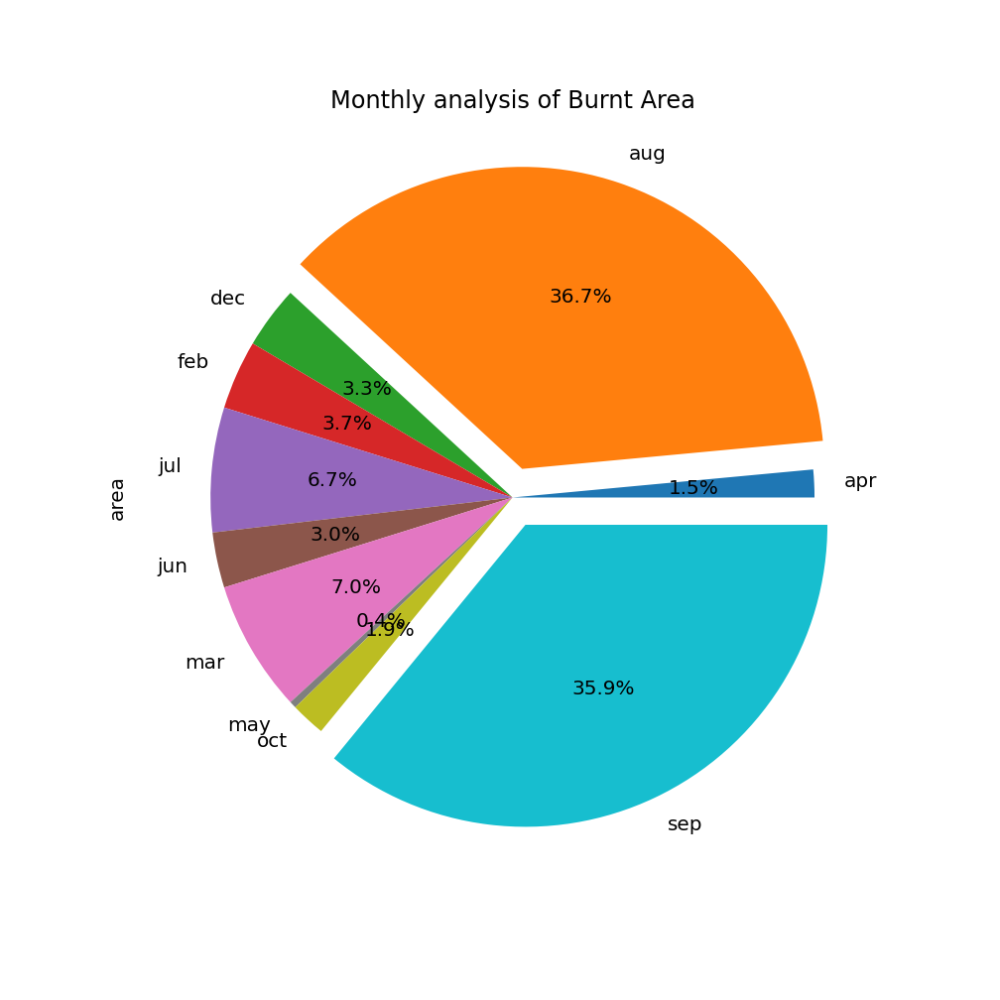

In [17]:
#Monthly analysis of burnt area, where the condition is: area>0
areaburnt=ff_data[ff_data['area']>0]
areaburnt.groupby('month')['area'].agg('count').plot(kind='pie',title='Monthly analysis of Burnt Area',figsize=(7,7),explode=[0,0.1,0,0,0,0,0,0,0,0.1],autopct='%0.1f%%')
plt.show()

### Observations:
1. In the month of **August** due to more fires in this month there was high burnt area upto 37% of land out of 100%
2. Followed to August, **September** got 36% of land burnt due to fires
3. The lowest area got burnt in the month of may
4. As we can assume that during the month of August and September there was an loss of soil fertility
5. By looking to graph we can predict that we should be prepared with fire extinguishers equipments before the august month

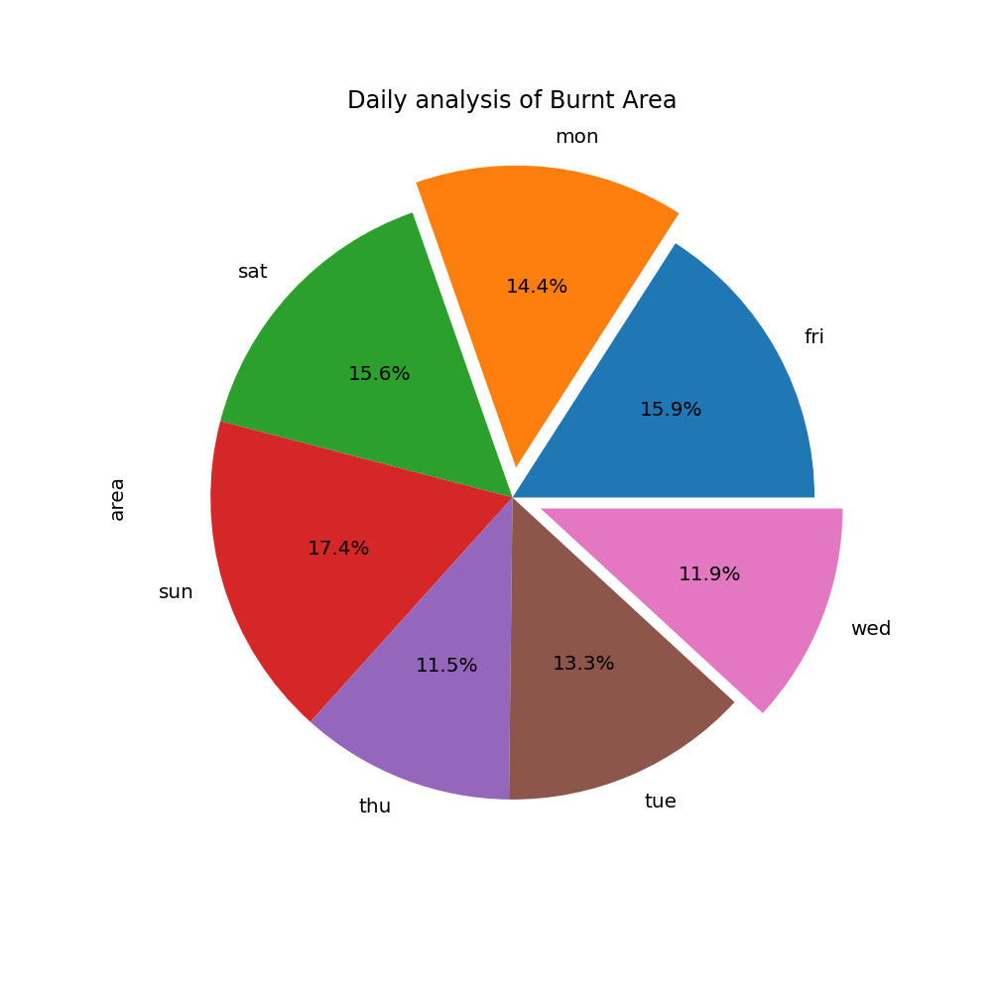

In [18]:
#Monthly analysis of burnt area, where the condition is: area>0

areaburnt=ff_data[ff_data['area']>0]
areaburnt.groupby('day')['area'].agg('count').plot(kind='pie',title='Daily analysis of Burnt Area',figsize=(7,7),explode=[0,0.1,0,0,0,0,0.1],autopct='%0.1f%%')
plt.show()

### Observations:
1. The highest burnt area is in **Sunday**
2. Th lowest burnt area is got in **Thursday**

In [19]:
ff_data.columns

Index(['month', 'day', 'FFMC', 'DMC', 'DC', 'ISI', 'temp', 'RH', 'wind',
       'rain', 'area', 'dayfri', 'daymon', 'daysat', 'daysun', 'daythu',
       'daytue', 'daywed', 'monthapr', 'monthaug', 'monthdec', 'monthfeb',
       'monthjan', 'monthjul', 'monthjun', 'monthmar', 'monthmay', 'monthnov',
       'monthoct', 'monthsep', 'size_category'],
      dtype='object')

Here as we can see that the columns `month` and `day` has been converted into dummies so now we do not required it so we will drop them

In [20]:
ff_data.pop('month') #pop is used to remove coloumns
ff_data.pop('day')

0      fri
1      tue
2      sat
3      fri
4      sun
      ... 
512    sun
513    sun
514    sun
515    sat
516    tue
Name: day, Length: 517, dtype: object

In [21]:
ff_data.head()

,FFMC,DMC,DC,ISI,temp,RH,wind,rain,area,dayfri,...,monthfeb,monthjan,monthjul,monthjun,monthmar,monthmay,monthnov,monthoct,monthsep,size_category
0,86.2,26.2,94.3,5.1,8.2,51,6.7,0.0,0.0,1,...,0,0,0,0,1,0,0,0,0,small
1,90.6,35.4,669.1,6.7,18.0,33,0.9,0.0,0.0,0,...,0,0,0,0,0,0,0,1,0,small
2,90.6,43.7,686.9,6.7,14.6,33,1.3,0.0,0.0,0,...,0,0,0,0,0,0,0,1,0,small
3,91.7,33.3,77.5,9.0,8.3,97,4.0,0.2,0.0,1,...,0,0,0,0,1,0,0,0,0,small
4,89.3,51.3,102.2,9.6,11.4,99,1.8,0.0,0.0,0,...,0,0,0,0,1,0,0,0,0,small


## Null Values / Missing Data

In [22]:
#Checking for missing data

NAs = pd.concat([ff_data.isnull().sum()], axis=1, keys=["Total NA"])
NAs[NAs.sum(axis=1) > 0]

,Total NA


#### There is no any missing value in the dataset 

## Duplicate Data

In [23]:
ff_data[ff_data.duplicated()].shape

(8, 29)

In [24]:
ff_data[ff_data.duplicated()]

,FFMC,DMC,DC,ISI,temp,RH,wind,rain,area,dayfri,...,monthfeb,monthjan,monthjul,monthjun,monthmar,monthmay,monthnov,monthoct,monthsep,size_category
53,92.1,111.2,654.1,9.6,20.4,42,4.9,0.0,0.00,0,...,0,0,0,0,0,0,0,0,0,small
100,91.4,142.4,601.4,10.6,19.8,39,5.4,0.0,0.00,0,...,0,0,0,0,0,0,0,0,0,small
215,91.7,35.8,80.8,7.8,17.0,27,4.9,0.0,28.66,0,...,0,0,0,0,1,0,0,0,0,large
303,91.1,94.1,232.1,7.1,19.2,38,4.5,0.0,0.00,1,...,0,0,0,1,0,0,0,0,0,small
426,91.6,248.4,753.8,6.3,20.4,56,2.2,0.0,0.00,0,...,0,0,0,0,0,0,0,0,0,small
461,93.7,231.1,715.1,8.4,18.9,64,4.9,0.0,0.00,0,...,0,0,0,0,0,0,0,0,0,small
501,96.1,181.1,671.2,14.3,21.6,65,4.9,0.8,0.00,0,...,0,0,0,0,0,0,0,0,0,small
508,91.0,166.9,752.6,7.1,25.9,41,3.6,0.0,0.00,1,...,0,0,0,0,0,0,0,0,0,small


In [25]:
#Droping the duplicate rows
ff_data=ff_data.drop_duplicates()

In [26]:
#Checking for duplication of data
ff_data[ff_data.duplicated()].shape

(0, 29)

- #### Now there is no any duplicate values

## Feature Engineering

In [27]:
ff_data['size_category']=ff_data['size_category'].apply(lambda x: 1 if x=='large' else 0)

As it's more efficient to work on dataset which contains features in number format.So, we are converting the dependent variable in categorical using lambda function.

In [28]:
ff_data.tail()

,FFMC,DMC,DC,ISI,temp,RH,wind,rain,area,dayfri,...,monthfeb,monthjan,monthjul,monthjun,monthmar,monthmay,monthnov,monthoct,monthsep,size_category
512,81.6,56.7,665.6,1.9,27.8,32,2.7,0.0,6.44,0,...,0,0,0,0,0,0,0,0,0,1
513,81.6,56.7,665.6,1.9,21.9,71,5.8,0.0,54.29,0,...,0,0,0,0,0,0,0,0,0,1
514,81.6,56.7,665.6,1.9,21.2,70,6.7,0.0,11.16,0,...,0,0,0,0,0,0,0,0,0,1
515,94.4,146.0,614.7,11.3,25.6,42,4.0,0.0,0.00,0,...,0,0,0,0,0,0,0,0,0,0
516,79.5,3.0,106.7,1.1,11.8,31,4.5,0.0,0.00,0,...,0,0,0,0,0,0,1,0,0,0


In [29]:
features = ['monthapr', 'monthaug', 'monthdec', 'monthfeb', 'monthjan', 'monthjul','monthjun', 
            'monthmar', 'monthmay', 'monthnov', 'monthoct', 'monthsep']

In [30]:
list(enumerate(features))

[(0, 'monthapr'),
 (1, 'monthaug'),
 (2, 'monthdec'),
 (3, 'monthfeb'),
 (4, 'monthjan'),
 (5, 'monthjul'),
 (6, 'monthjun'),
 (7, 'monthmar'),
 (8, 'monthmay'),
 (9, 'monthnov'),
 (10, 'monthoct'),
 (11, 'monthsep')]

## Boxplot
### Indepent variables with Continuous values

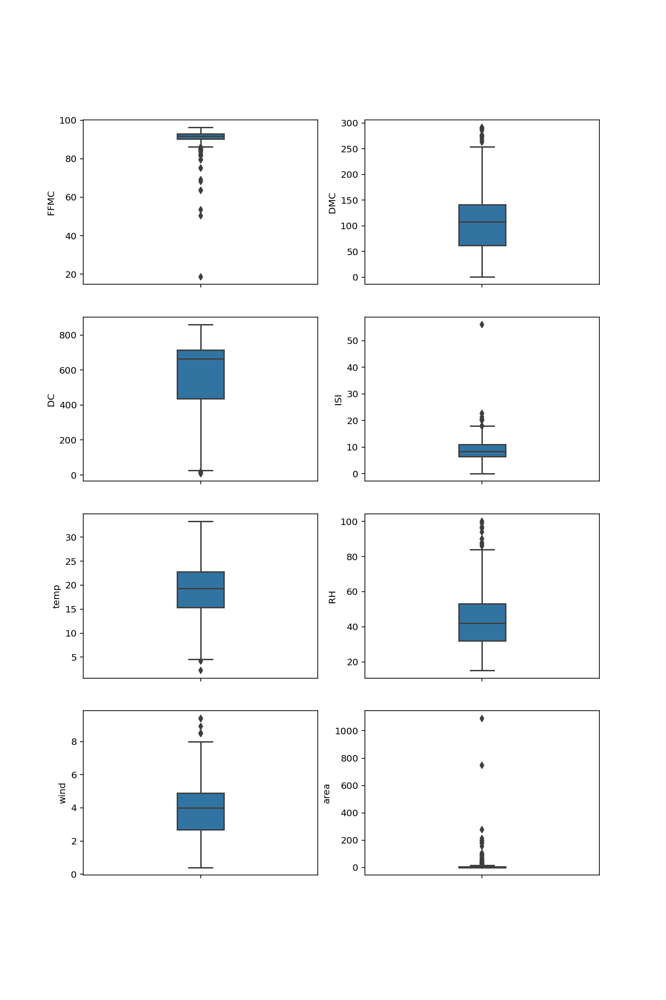

In [33]:
cols = ['FFMC', 'DMC', 'DC', 'ISI', 'temp', 'RH', 'wind', 'area']
plt.figure(figsize=(10,15))

i=1
for col in cols:
    plt.subplot(4,2,i)
    sns.boxplot(y=col, data=ff_data,width=0.2)
    i+=1
plt.show()

### Observations:
1. DC has highest mean among the other continues independent variables
2. wind has lowest mean
3. as DC has high mean there is higb variance in the data points but having less numbers of outliers
4. IQR range is very less in FFMC having more number's of outliers 

## Detecting Outliers

<Figure size 432x288 with 0 Axes>

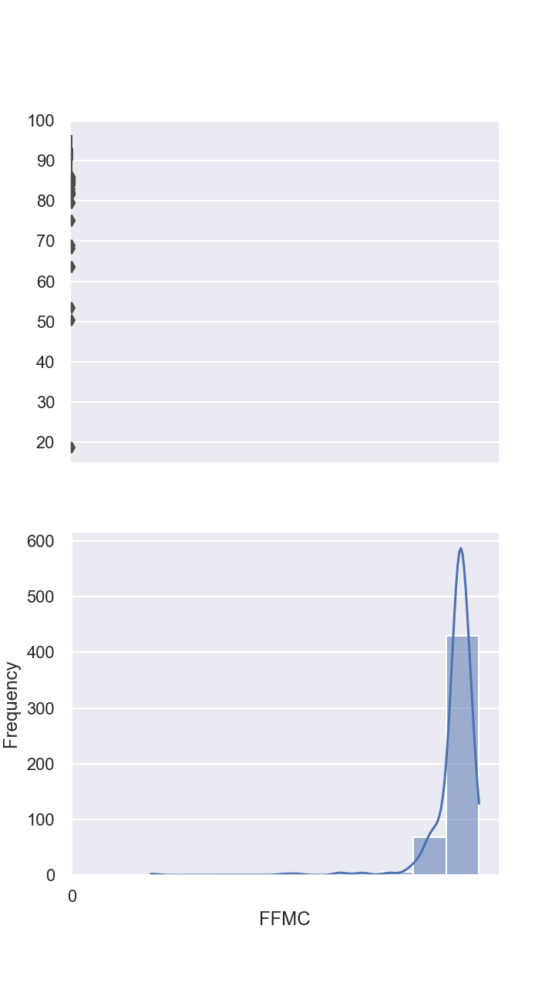

<Figure size 360x648 with 0 Axes>

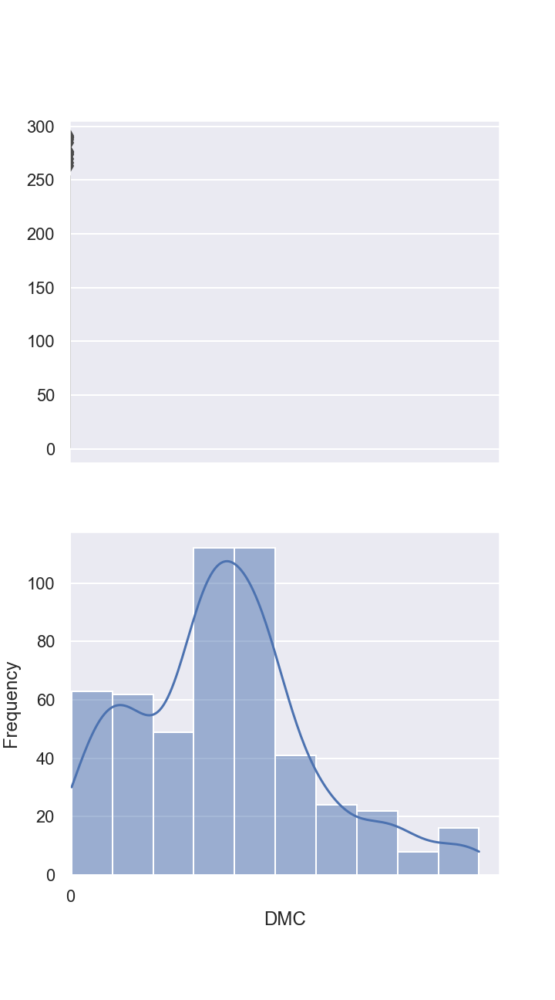

<Figure size 360x648 with 0 Axes>

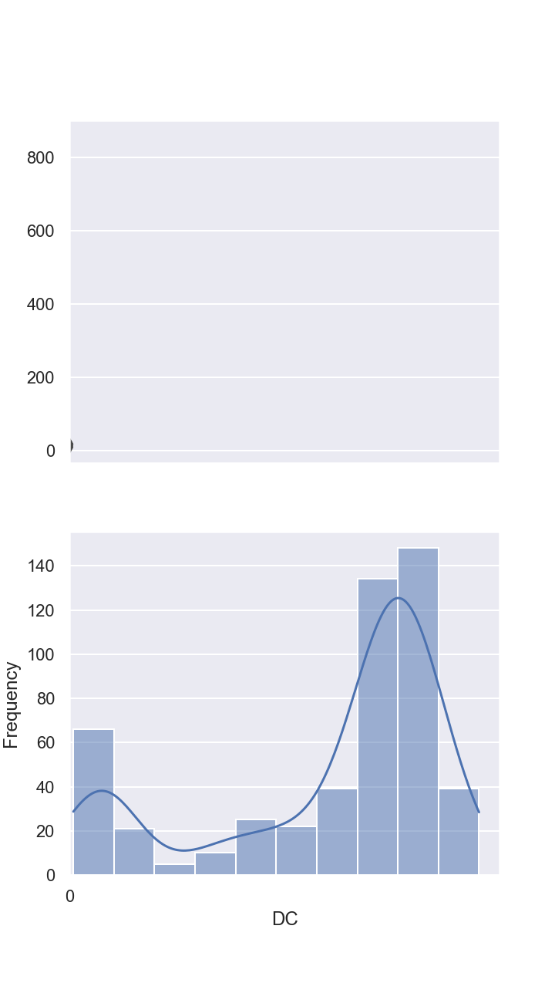

<Figure size 360x648 with 0 Axes>

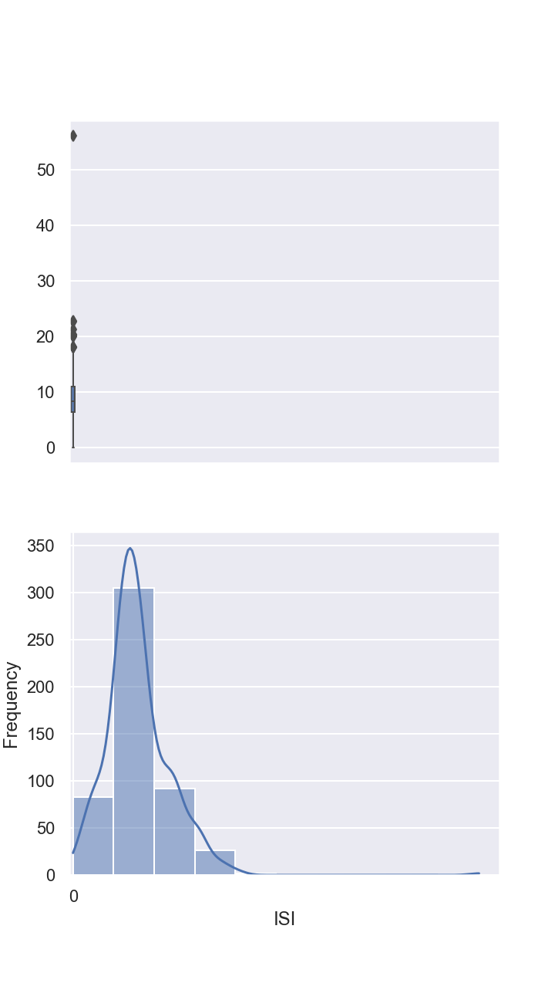

<Figure size 360x648 with 0 Axes>

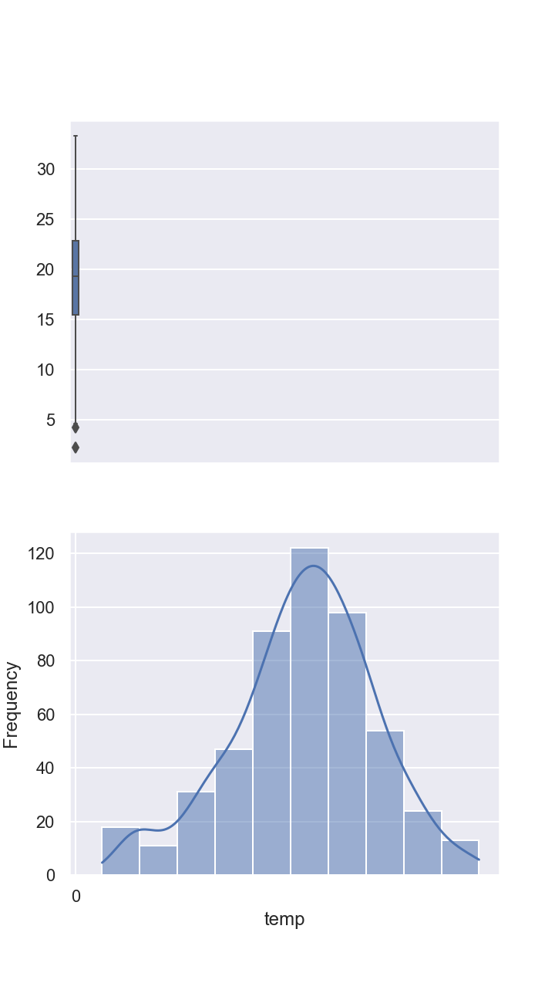

<Figure size 360x648 with 0 Axes>

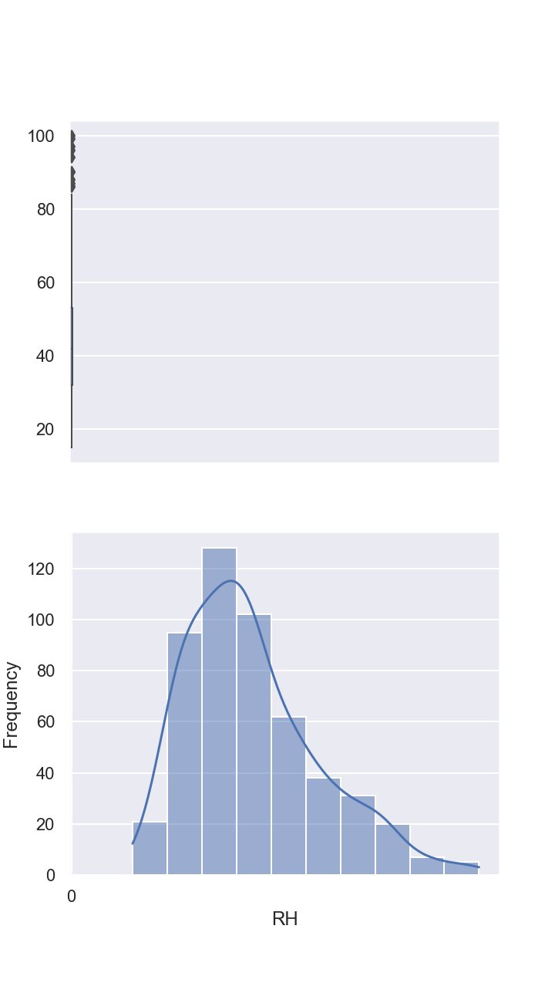

<Figure size 360x648 with 0 Axes>

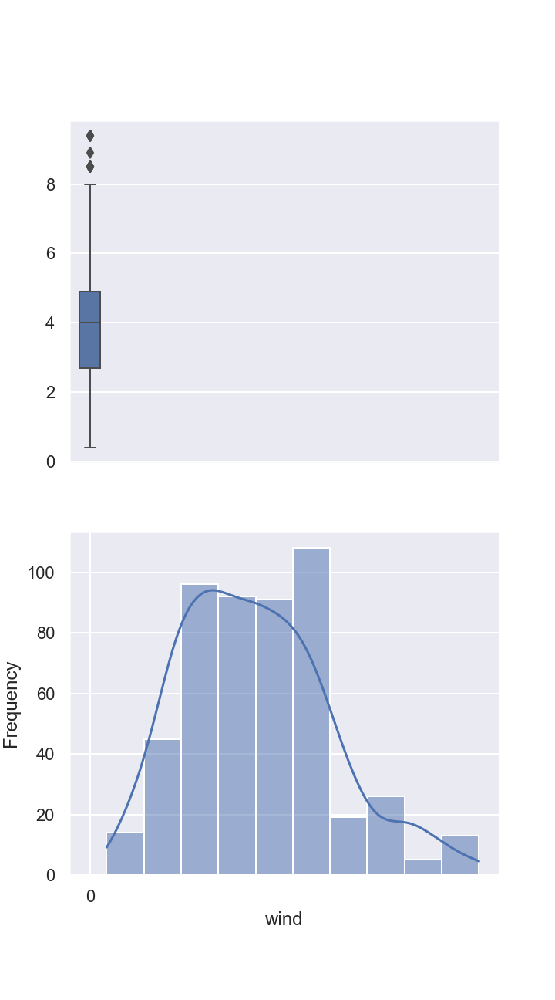

<Figure size 360x648 with 0 Axes>

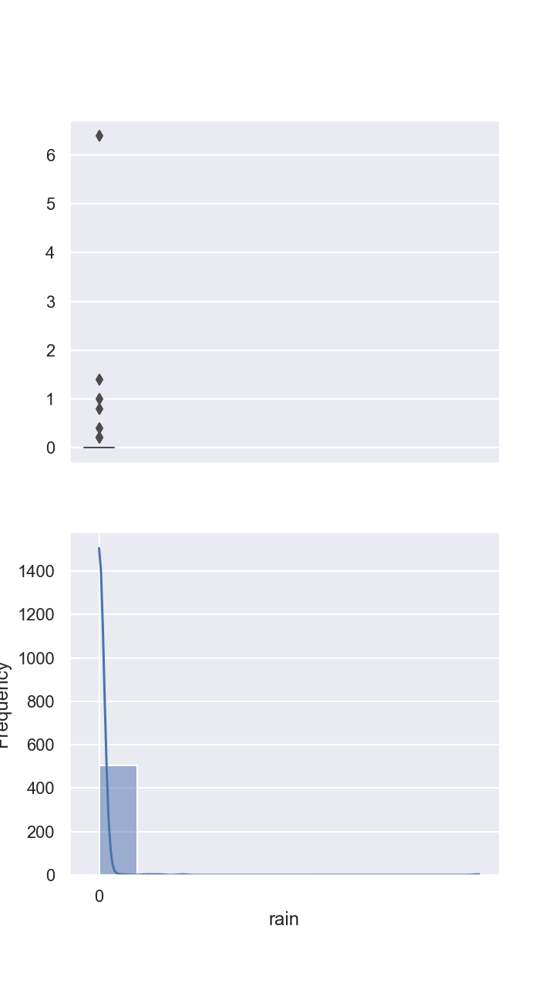

<Figure size 360x648 with 0 Axes>

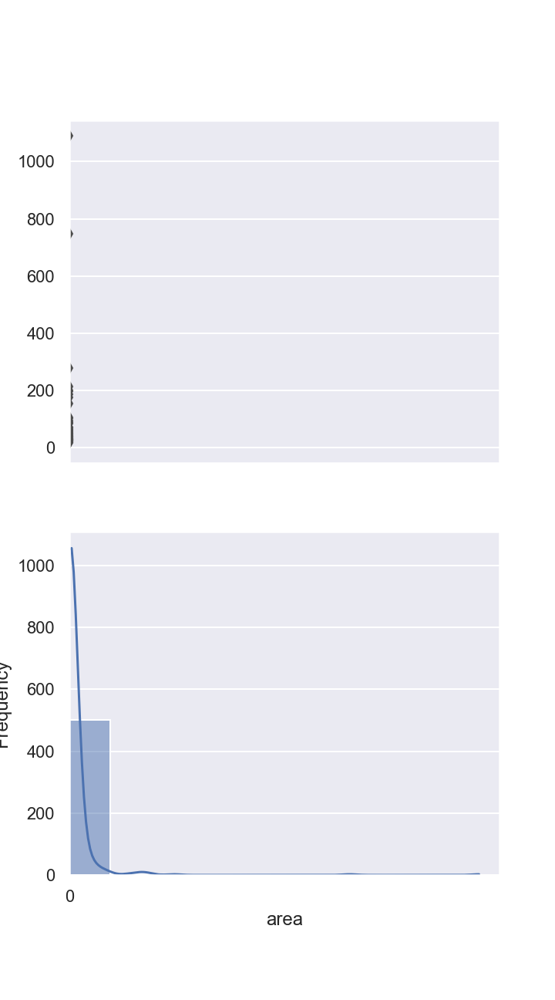

<Figure size 360x648 with 0 Axes>

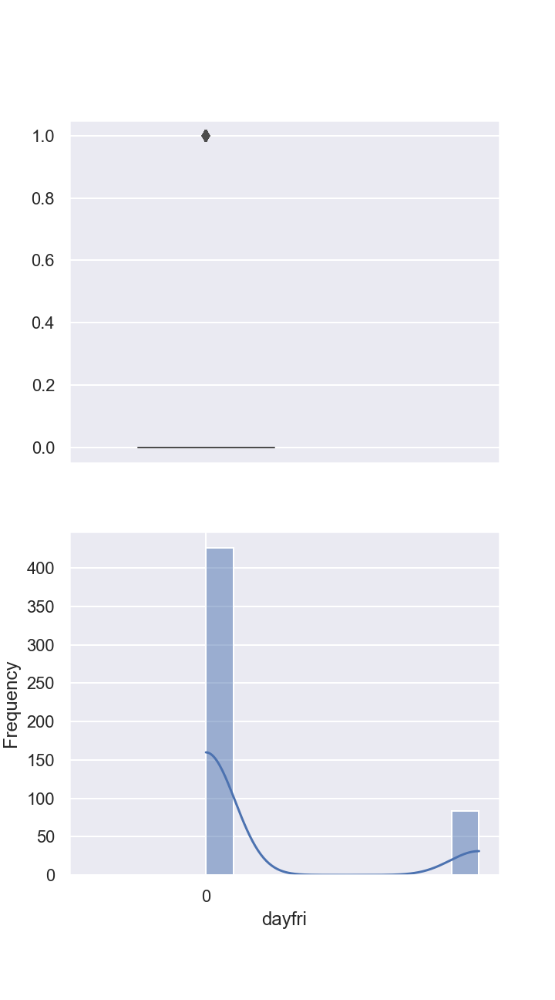

<Figure size 360x648 with 0 Axes>

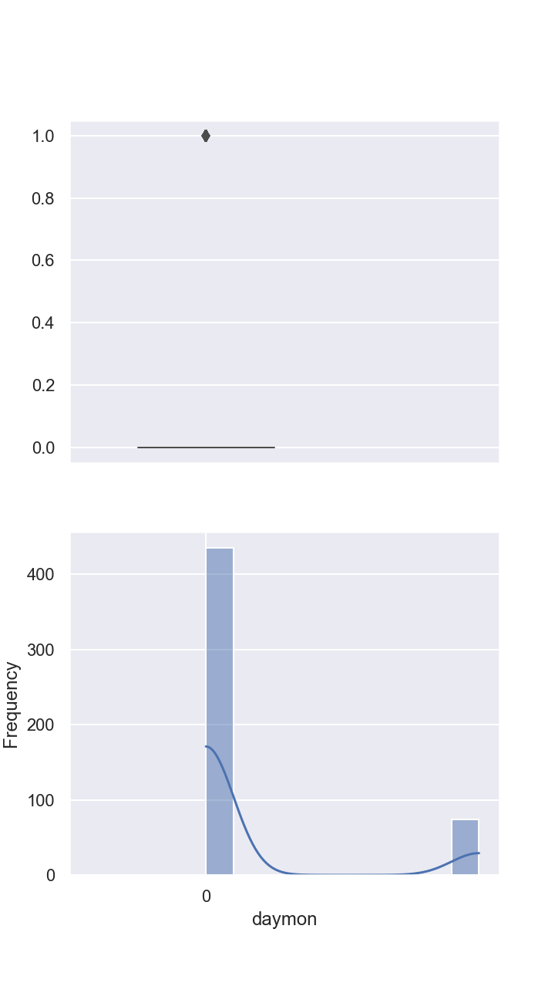

<Figure size 360x648 with 0 Axes>

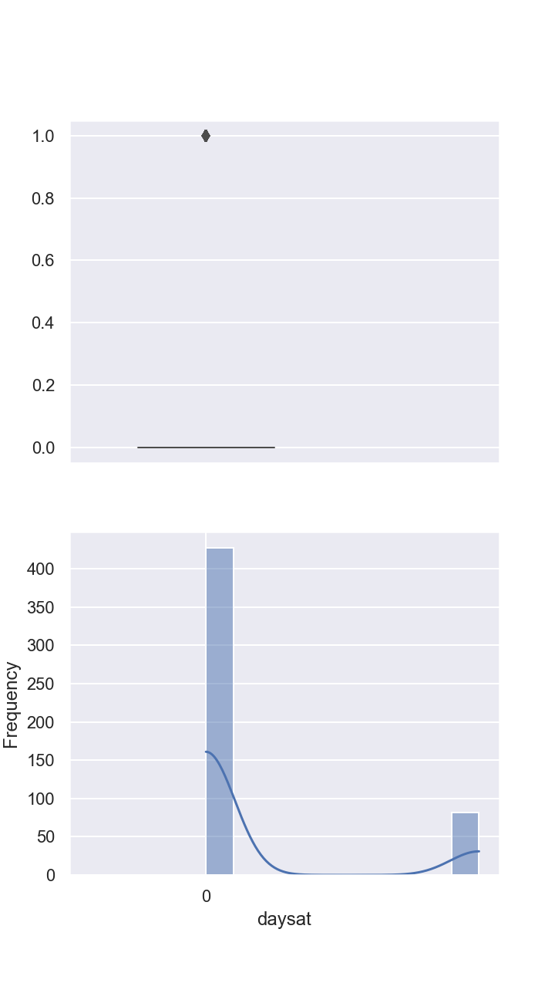

<Figure size 360x648 with 0 Axes>

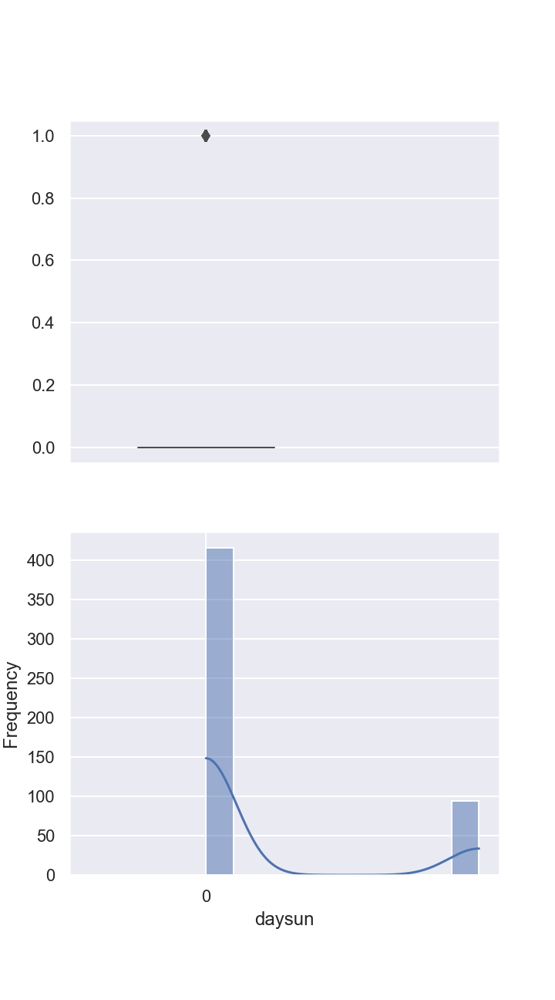

<Figure size 360x648 with 0 Axes>

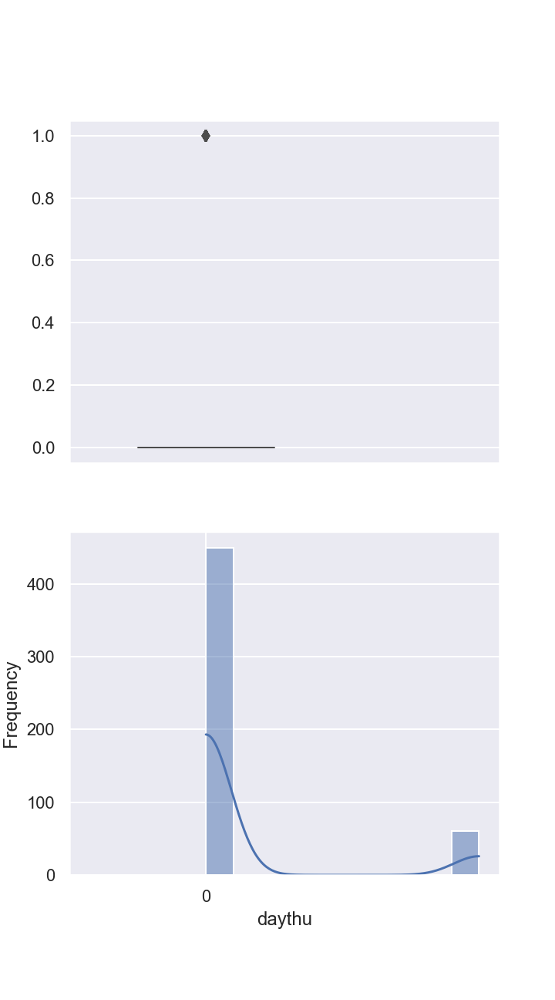

<Figure size 360x648 with 0 Axes>

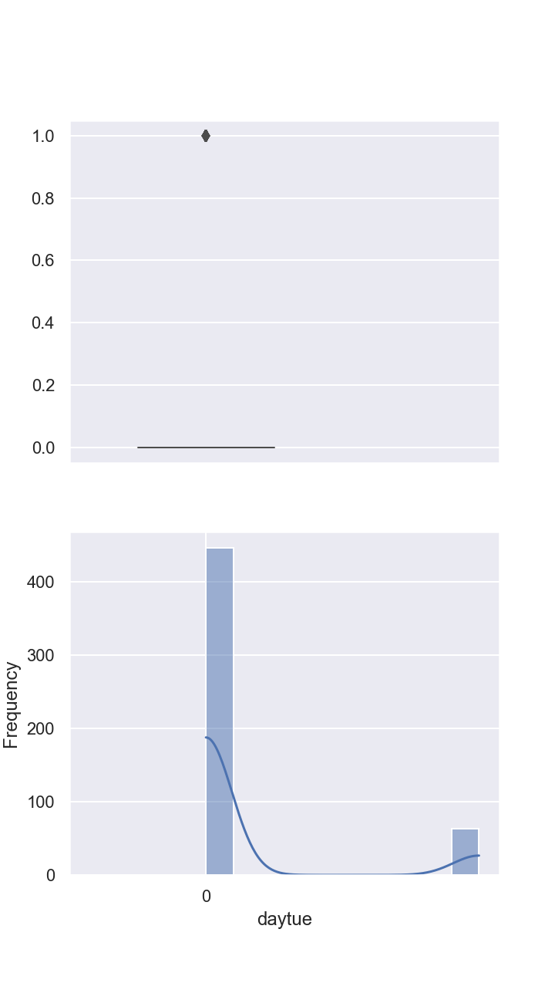

<Figure size 360x648 with 0 Axes>

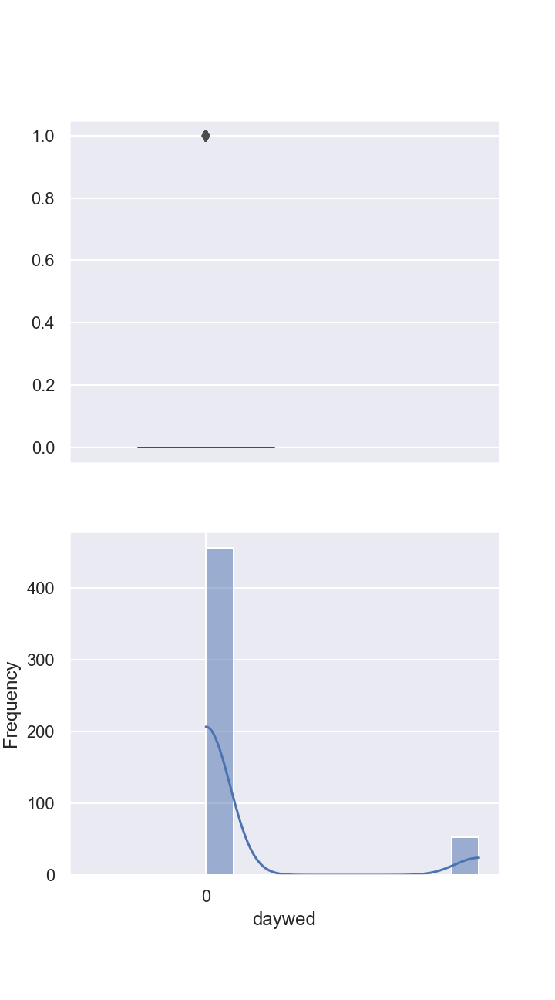

<Figure size 360x648 with 0 Axes>

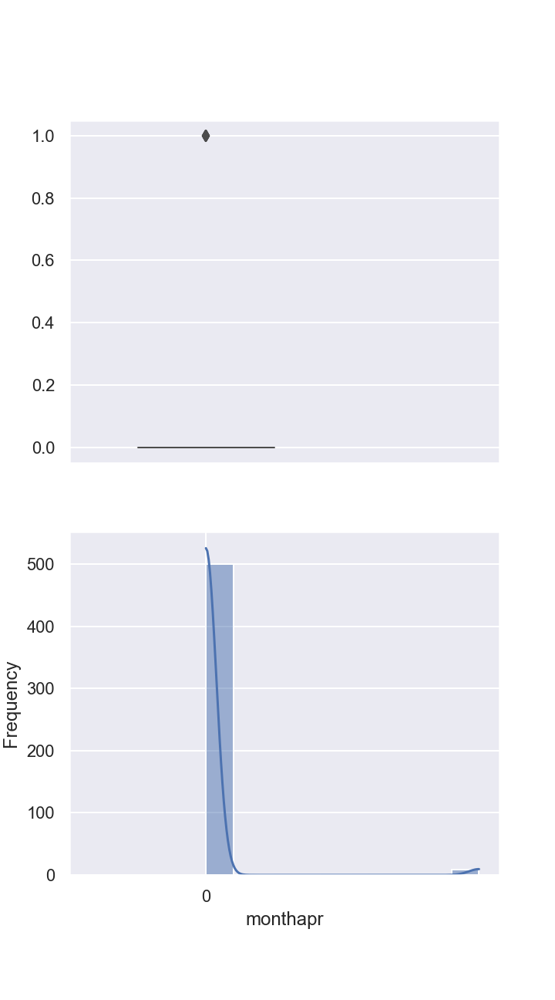

<Figure size 360x648 with 0 Axes>

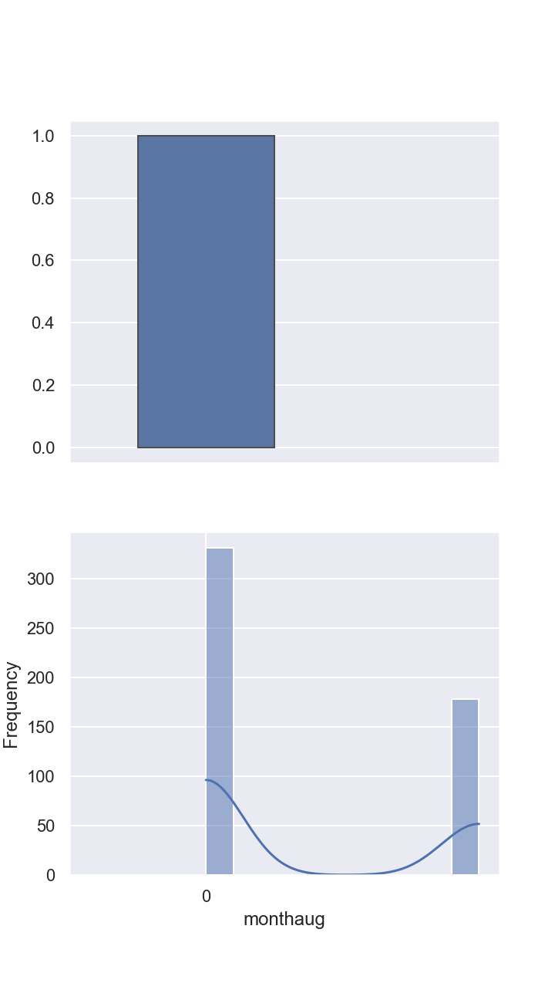

<Figure size 360x648 with 0 Axes>

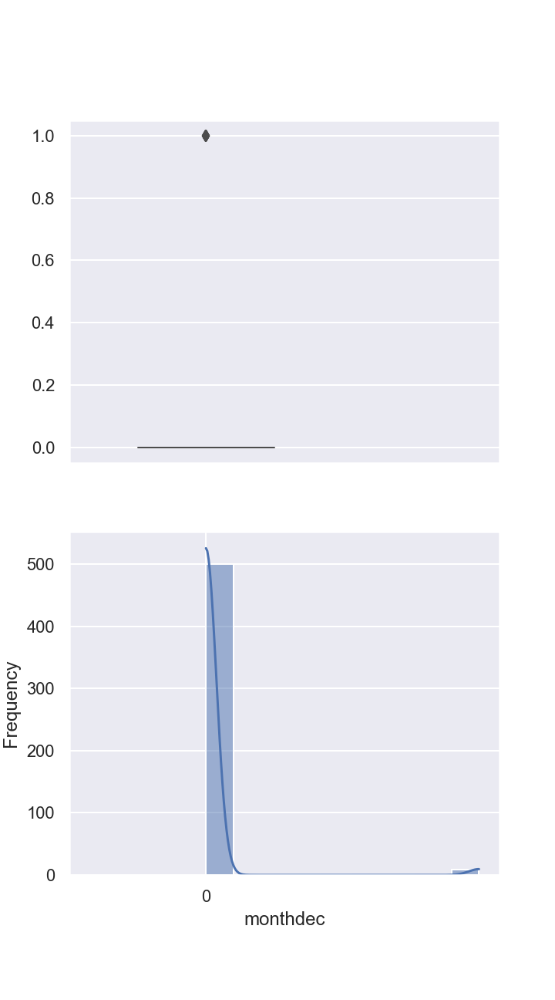

<Figure size 360x648 with 0 Axes>

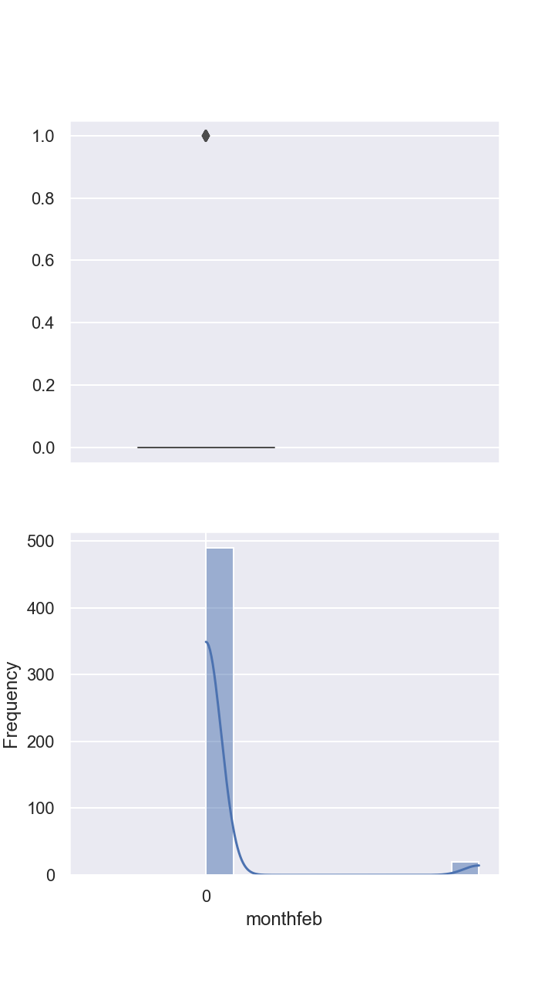

<Figure size 360x648 with 0 Axes>

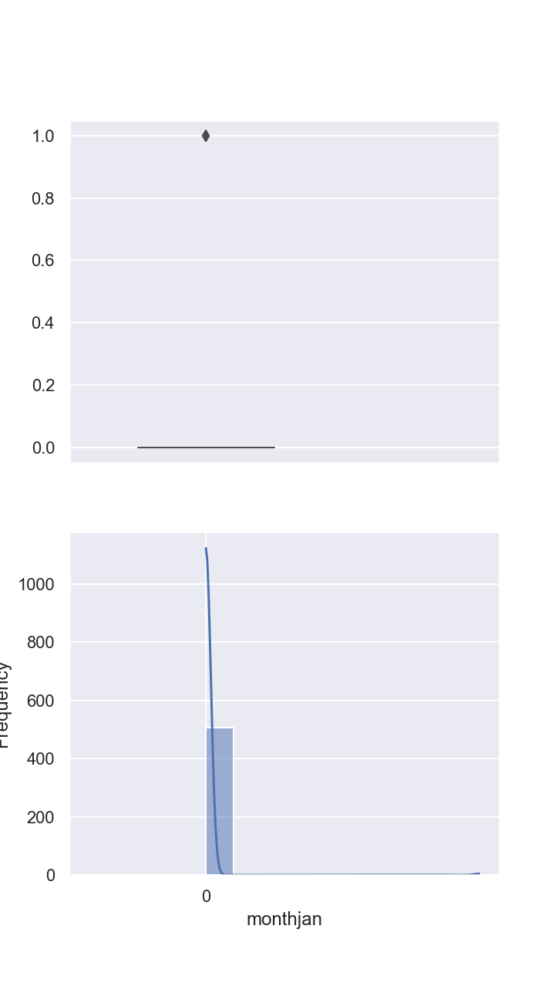

<Figure size 360x648 with 0 Axes>

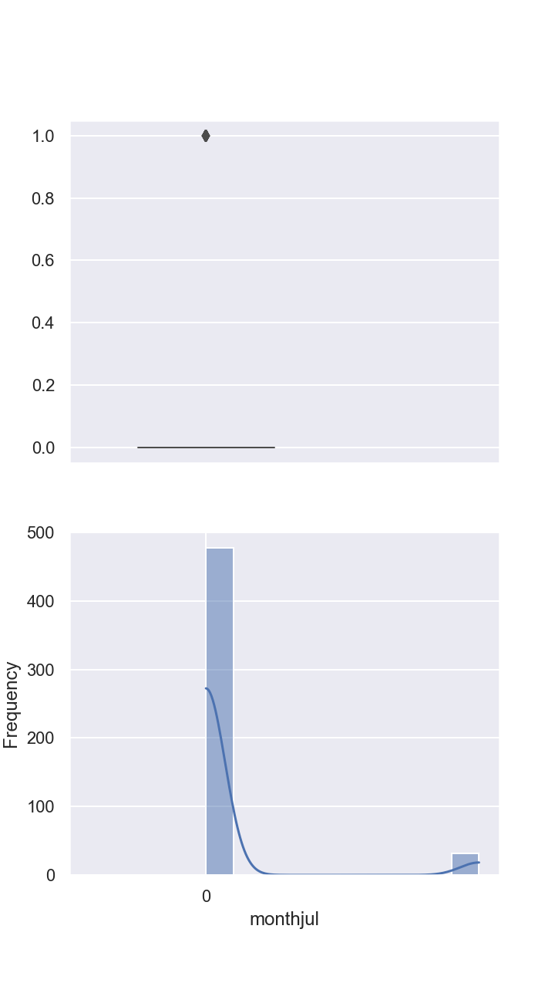

<Figure size 360x648 with 0 Axes>

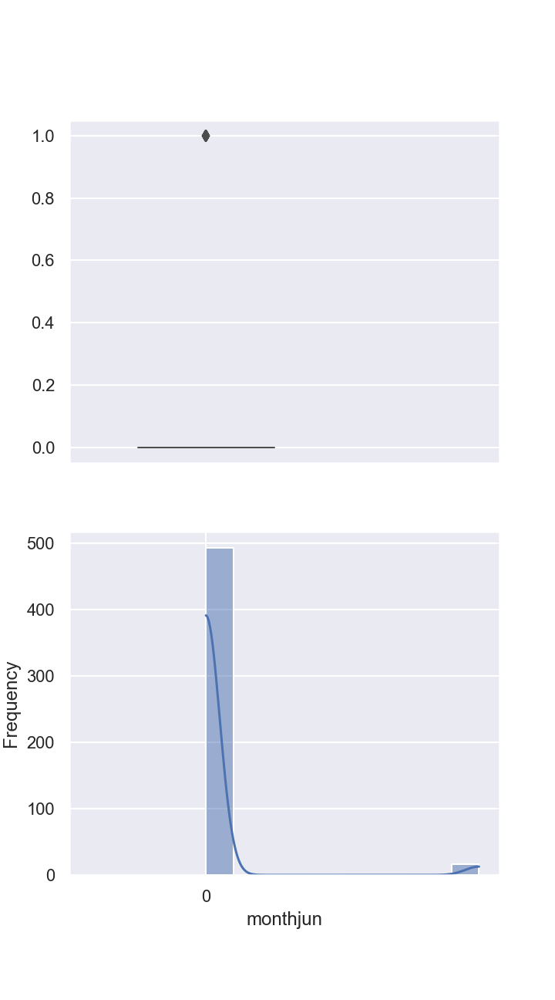

<Figure size 360x648 with 0 Axes>

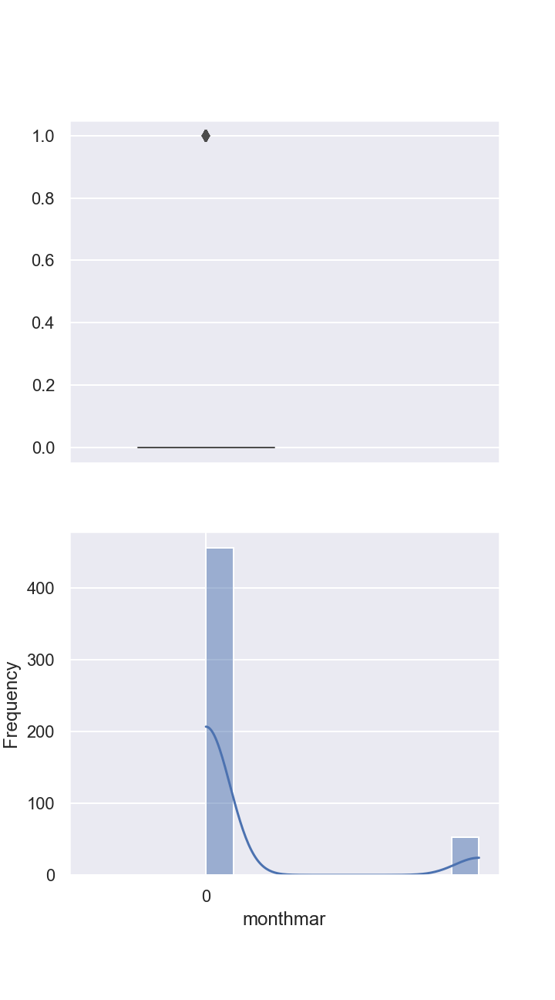

<Figure size 360x648 with 0 Axes>

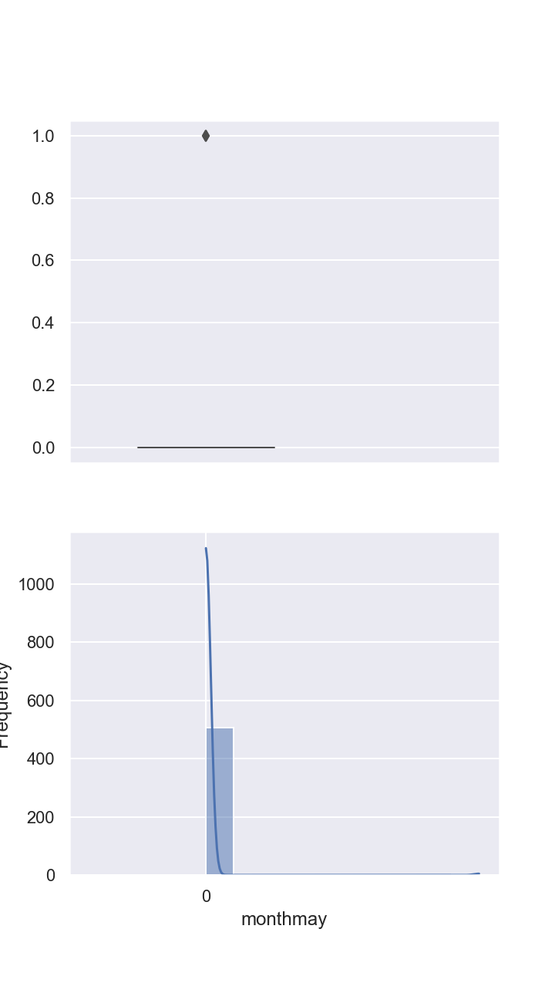

<Figure size 360x648 with 0 Axes>

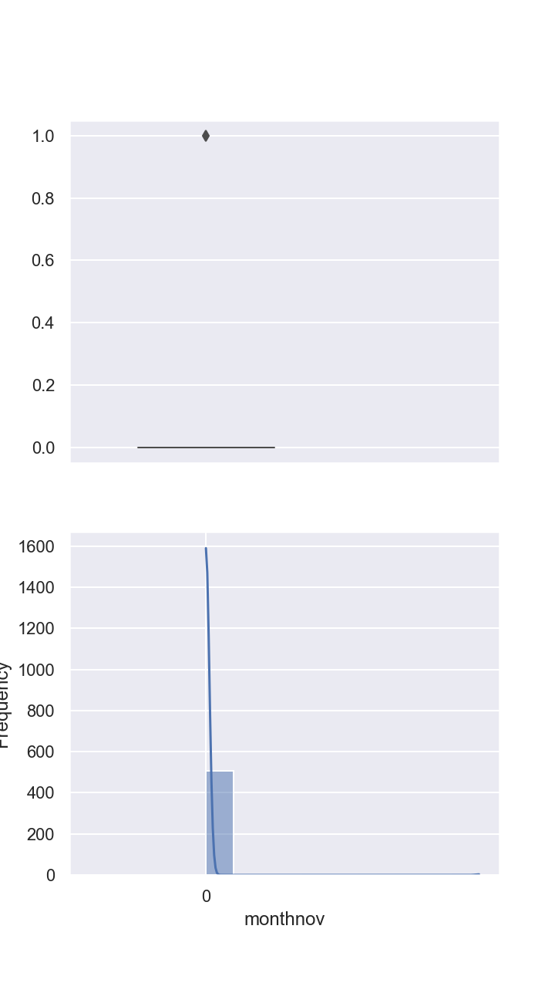

<Figure size 360x648 with 0 Axes>

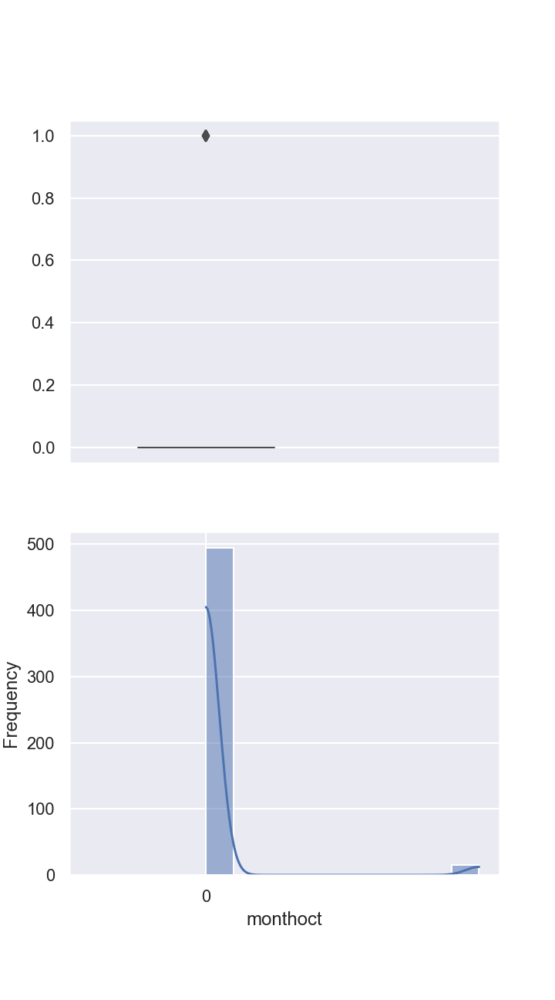

<Figure size 360x648 with 0 Axes>

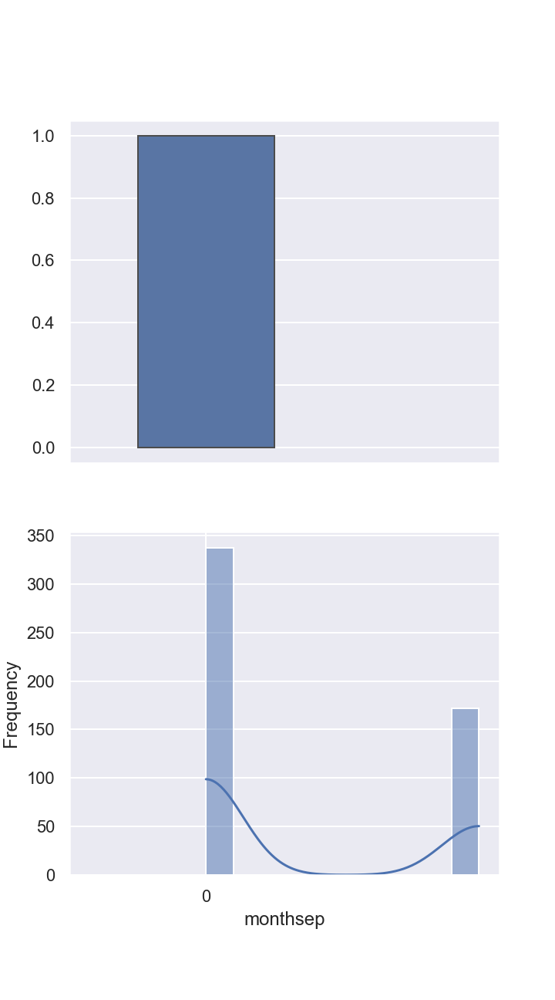

<Figure size 360x648 with 0 Axes>

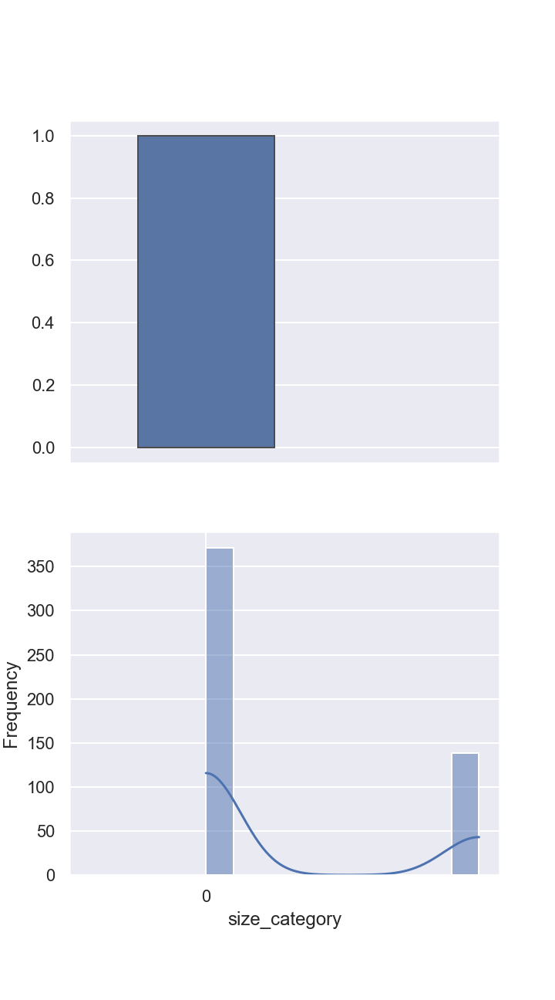

In [34]:
# A for loop to automate our task
for i in ff_data.columns:
    plt.figure()
    plt.tight_layout()
    sns.set(rc={"figure.figsize":(5,9)})
    f, (ax_box, ax_hist) = plt.subplots(2, sharex=True)
    plt.gca().set(xlabel= i,ylabel='Frequency')
    sns.boxplot(ff_data[i], ax=ax_box , linewidth= 1.0,width=0.5)
    sns.histplot(ff_data[i], ax=ax_hist , bins = 10,kde=True)

### Observations:
1. the feature Temperature has **Normal distribution** means its mean,mode and median will be same
2. DMC and RH has **Postitive skewness** where mean is greater than median,and median is greater than mode
3. DC and FFMC has **Negative skewness** where mean is lower than median and mean

## Pairplot
### Checking relationship

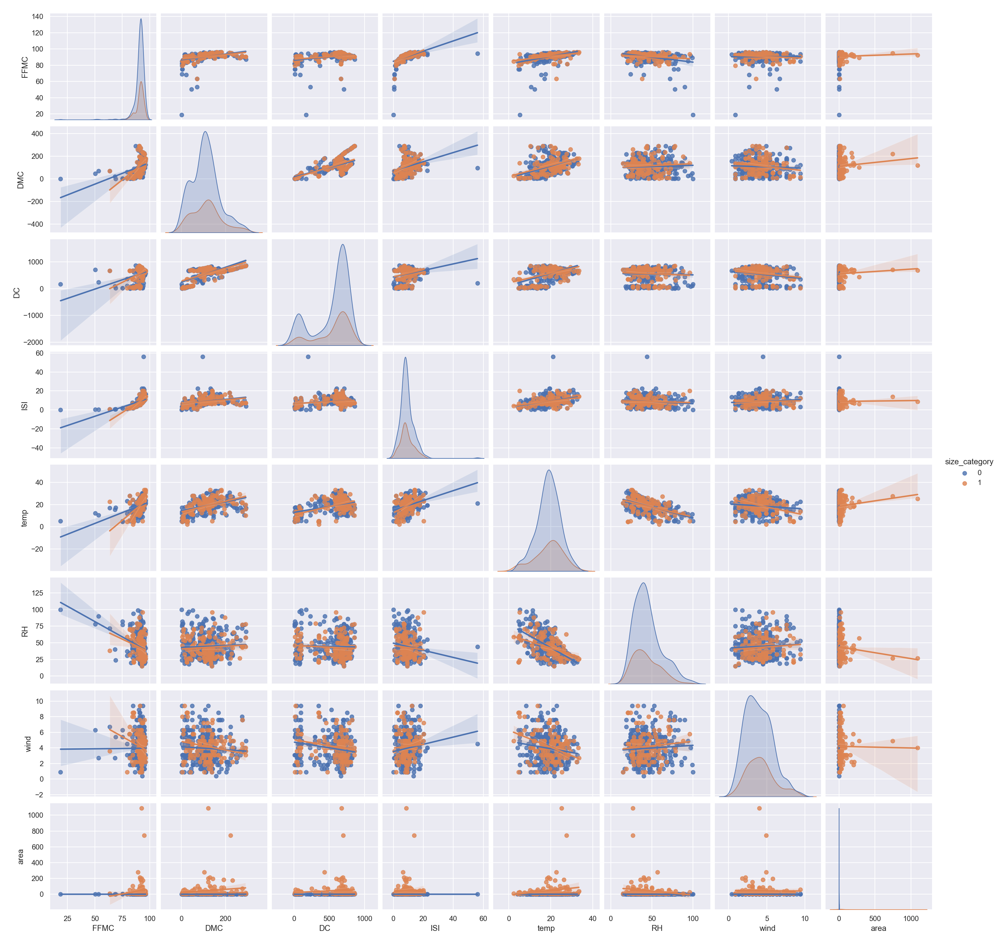

In [35]:
sns.pairplot(ff_data,x_vars=['FFMC', 'DMC', 'DC', 'ISI', 'temp', 'RH', 'wind', 'area'],
             y_vars=['FFMC', 'DMC', 'DC', 'ISI', 'temp', 'RH', 'wind', 'area'],hue='size_category',
             kind='reg',diag_kind='kde')
plt.show()

### Observations:
1. Temperature and relative humidity has high collinearity with dependent varible('size_category')
2. deep moist convection (DMC) and temp have relation with each other
3. Most of the independent varibles are skewed to with respect to each others


## Scatter Plot

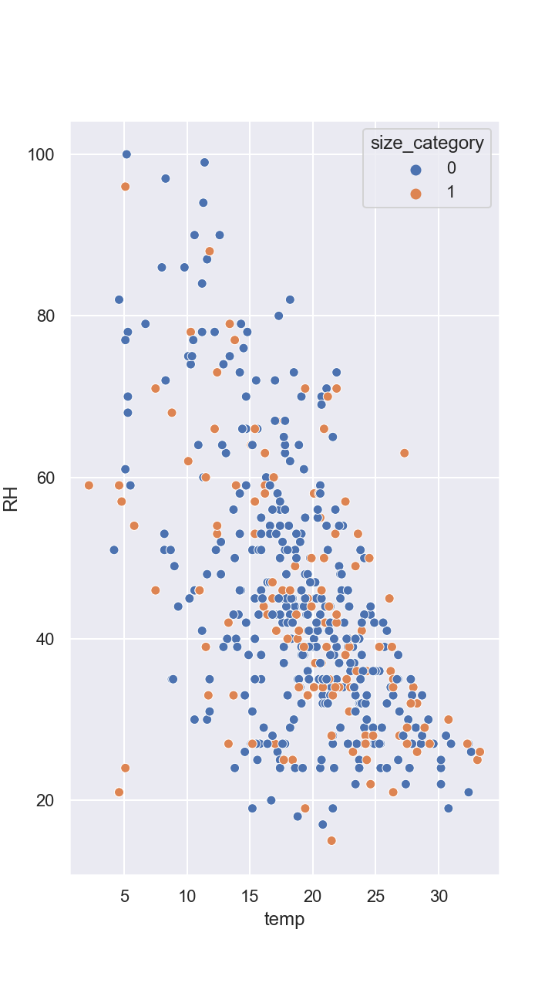

In [36]:
sns.scatterplot(x='temp',y='RH',data=ff_data,hue='size_category')
plt.show()

### Observations:
1. The RH and temp having negative relation
2. We can see that temperature is increasing the relative humidity decreasing
3. Which led to less number of fires took place

In [37]:
fig = px.scatter(ff_data, x="temp", y="DMC", color='size_category')
fig.show()

### Observations:
1. The DMC and temp having postive relation
2. We can see that temperature is increasing the  DMC also increasing

In [38]:
#Importing the modules
from bokeh.palettes import magma
from bokeh.plotting import figure, output_file, show

# file to save the model
output_file("output.html")

#Instantiating the figure object
graph = figure(title = "Scatter Plot")

#name of the x-axis
graph.xaxis.axis_label = "Temperature"

#name of the y-axis
graph.yaxis.axis_label = "DC"


#Color value of the scatter points
color = magma(256)

x=ff_data['temp']
y=ff_data['DC']
graph.scatter(x, y,color = color)

show(graph)


<img src='bokeh_plot.png'/>

## Correlation Matrix
### corr() is used to find the pairwise correlation of all columns in the Pandas Dataframe in Python. Any NaN values are automatically excluded. Any non-numeric data type or columns in the Dataframe, it is ignored.</h4>

In [39]:
cor = ff_data.corr()
cor

,FFMC,DMC,DC,ISI,temp,RH,wind,rain,area,dayfri,...,monthfeb,monthjan,monthjul,monthjun,monthmar,monthmay,monthnov,monthoct,monthsep,size_category
FFMC,1.000000,0.382925,0.331956,0.531926,0.431744,-0.306262,-0.030409,0.052280,0.040998,0.020889,...,-0.281054,-0.455128,0.033137,-0.041972,-0.074706,-0.036983,-0.088879,-0.005172,0.080444,0.024292
DMC,0.382925,1.000000,0.681446,0.309459,0.470875,0.062772,-0.104563,0.071017,0.076932,-0.011152,...,-0.319691,-0.106256,0.000617,-0.047759,-0.404974,-0.082312,-0.074642,-0.188126,0.119779,0.046598
DC,0.331956,0.681446,1.000000,0.229757,0.496608,-0.047971,-0.202856,0.033772,0.051542,-0.001642,...,-0.402201,-0.115871,-0.101518,-0.178719,-0.648890,-0.115010,-0.078927,0.094091,0.538299,0.028372
ISI,0.531926,0.309459,0.229757,1.000000,0.395858,-0.135955,0.104834,0.062132,0.008429,0.051599,...,-0.250494,-0.103846,0.020932,0.119765,-0.143589,-0.060655,-0.076748,-0.071401,-0.069600,-0.007867
temp,0.431744,0.470875,0.496608,0.395858,1.000000,-0.532503,-0.227754,0.067911,0.099173,-0.077766,...,-0.319901,-0.146547,0.143987,0.052779,-0.342129,-0.045372,-0.053720,-0.052918,0.091428,0.009976
RH,-0.306262,0.062772,-0.047971,-0.135955,-0.532503,1.000000,0.070721,0.094343,-0.074554,0.069599,...,0.141593,0.171900,0.013808,0.014425,-0.083581,0.087384,-0.035967,-0.072335,-0.061631,-0.039730
wind,-0.030409,-0.104563,-0.202856,0.104834,-0.227754,0.070721,1.000000,0.059332,0.012623,0.121056,...,-0.028820,-0.070217,-0.039880,0.010124,0.181610,0.015311,0.012049,-0.053404,-0.180211,0.059513
rain,0.052280,0.071017,0.033772,0.062132,0.067911,0.094343,0.059332,1.000000,-0.006511,-0.001723,...,-0.013961,-0.004336,-0.012411,-0.012437,-0.019189,-0.004336,-0.003063,-0.012030,-0.049319,0.053463
area,0.040998,0.076932,0.051542,0.008429,0.099173,-0.074554,0.012623,-0.006511,1.000000,-0.052390,...,-0.021205,-0.012737,0.005566,-0.019083,-0.048394,0.006124,-0.008997,-0.017284,0.055191,0.310561
dayfri,0.020889,-0.011152,-0.001642,0.051599,-0.077766,0.069599,0.121056,-0.001723,-0.052390,1.000000,...,0.047592,-0.027723,-0.048598,-0.018562,0.041050,0.057284,-0.019584,-0.045470,0.111903,-0.017980


## Heatmap
### Checking corelation 

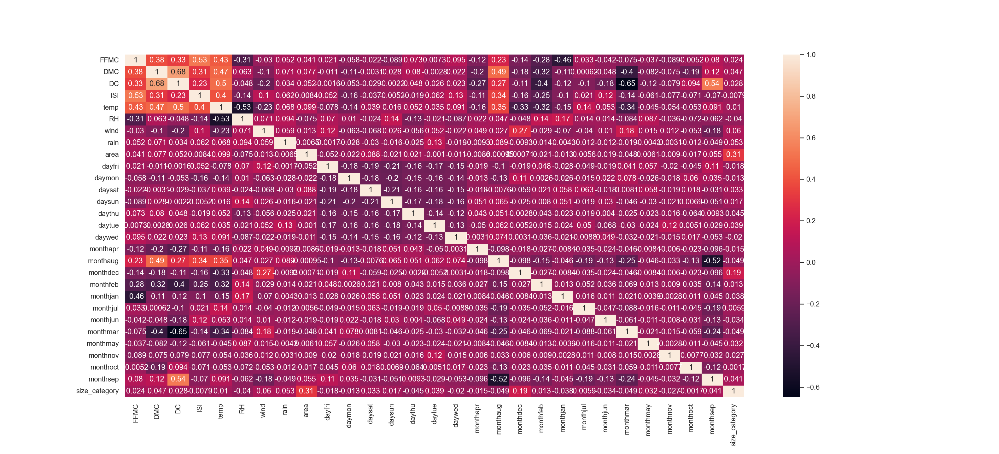

In [40]:
plt.figure(figsize=(22,10))
sns.heatmap(cor, annot=True,)
plt.show()

### Observations:
1. In the heatmap we can see that the highest relationship is between DC and dmc
2. We should focus more on this two fetaures for analysis

In [41]:
X = ff_data.drop('size_category', axis=1)
Y = ff_data[["size_category"]]

## Feature Engineering

- ### Univariate Feature Selection

In [42]:
#Feature Extraction with Univariate Statistical Tests (Chi-squared for classification)

from numpy import set_printoptions
from sklearn.feature_selection import SelectKBest
from sklearn.feature_selection import chi2
from sklearn.feature_selection import mutual_info_regression
from sklearn.model_selection import train_test_split

In [43]:
#Feature extraction

test = SelectKBest(score_func=mutual_info_regression, k='all')
fit = test.fit(X, Y)

In [44]:
X

,FFMC,DMC,DC,ISI,temp,RH,wind,rain,area,dayfri,...,monthdec,monthfeb,monthjan,monthjul,monthjun,monthmar,monthmay,monthnov,monthoct,monthsep
0,86.2,26.2,94.3,5.1,8.2,51,6.7,0.0,0.00,1,...,0,0,0,0,0,1,0,0,0,0
1,90.6,35.4,669.1,6.7,18.0,33,0.9,0.0,0.00,0,...,0,0,0,0,0,0,0,0,1,0
2,90.6,43.7,686.9,6.7,14.6,33,1.3,0.0,0.00,0,...,0,0,0,0,0,0,0,0,1,0
3,91.7,33.3,77.5,9.0,8.3,97,4.0,0.2,0.00,1,...,0,0,0,0,0,1,0,0,0,0
4,89.3,51.3,102.2,9.6,11.4,99,1.8,0.0,0.00,0,...,0,0,0,0,0,1,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
512,81.6,56.7,665.6,1.9,27.8,32,2.7,0.0,6.44,0,...,0,0,0,0,0,0,0,0,0,0
513,81.6,56.7,665.6,1.9,21.9,71,5.8,0.0,54.29,0,...,0,0,0,0,0,0,0,0,0,0
514,81.6,56.7,665.6,1.9,21.2,70,6.7,0.0,11.16,0,...,0,0,0,0,0,0,0,0,0,0
515,94.4,146.0,614.7,11.3,25.6,42,4.0,0.0,0.00,0,...,0,0,0,0,0,0,0,0,0,0


In [45]:
Y

,size_category
0,0
1,0
2,0
3,0
4,0
...,...
512,1
513,1
514,1
515,0


In [46]:
#Summarize scores

scores = fit.scores_
features = fit.transform(X)                            

In [47]:
score_df = pd.DataFrame(list(zip(scores, X)),
               columns =['Score', 'Feature'])
score_df.sort_values(by="Score", ascending=False, inplace=True)
score_df

,Score,Feature
8,0.547390,area
26,0.056288,monthoct
5,0.033799,RH
22,0.033657,monthjun
1,0.023623,DMC
4,0.019335,temp
15,0.014746,daywed
0,0.013084,FFMC
23,0.012047,monthmar
2,0.010935,DC


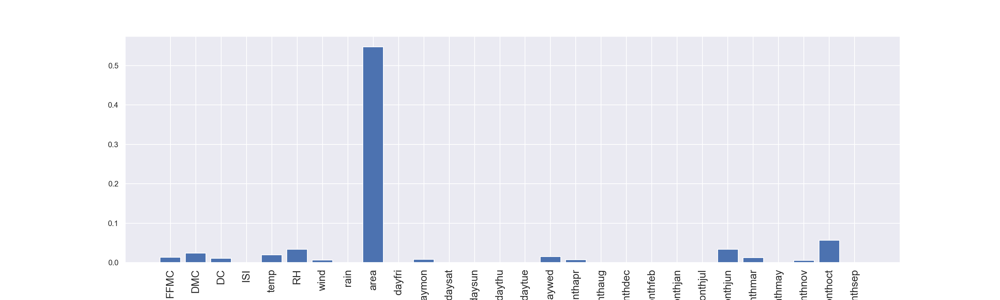

In [48]:
fig, axes = plt.subplots(figsize=(20, 6))
plt.bar([i for i in range(len(scores))],scores)
axes.set_xticks([i for i in range(len(X.columns))])
axes.set_xticklabels(X.columns.values)
plt.xticks(rotation = 90, size = 15)
plt.show()

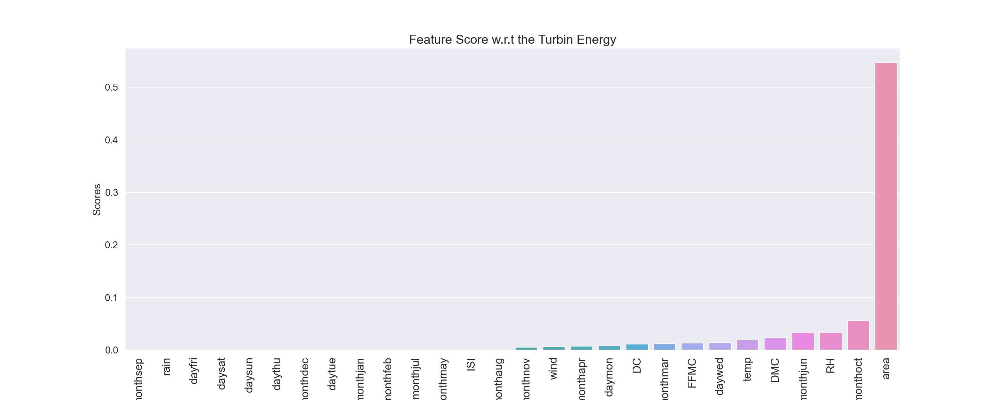

In [49]:
plt.figure(figsize=(20,8))

#Make barplot and sort bars
sns.barplot(x='Feature',
            y="Score", 
            data=score_df, 
            order=score_df.sort_values('Score').Feature)
#Set labels
plt.xlabel("Features", size=15)
plt.ylabel("Scores", size=15)
plt.yticks(rotation = 0, fontsize = 14)
plt.xticks(rotation = 90, fontsize = 16)
plt.title("Feature Score w.r.t the Turbin Energy", size=18)
plt.show()

- ### Recursive Feature Elimination

In [50]:
from sklearn.feature_selection import RFE
from sklearn.linear_model import LogisticRegression

In [51]:
#Feature extraction
model = LogisticRegression(max_iter=400)
rfe = RFE(model, n_features_to_select=3)
fit = rfe.fit(X, Y)

In [52]:
#Feature Ranking:
fit.ranking_

array([10, 23, 24,  8, 16, 17, 14, 22,  1,  5, 15,  1,  2,  3,  4, 12, 19,
       18,  7,  9, 21,  1, 20, 13, 26, 25, 11,  6])

## Feature Importance : Decision Tree

In [53]:
from sklearn.tree import  DecisionTreeClassifier

In [54]:
#Feature extraction
model = DecisionTreeClassifier()
model.fit(X,Y)

DecisionTreeClassifier()

In [55]:
print(model.feature_importances_)

[0. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0.]


In [56]:
df=forest.copy()

In [57]:
model_data=df[['DMC','DC','RH','rain','wind','area','monthapr', 'monthaug', 'monthdec', 'monthfeb', 'monthjan',
       'monthjul', 'monthjun', 'monthmar', 'monthmay', 'monthnov',
       'monthoct', 'monthsep','size_category']]
model_data

,DMC,DC,RH,rain,wind,area,monthapr,monthaug,monthdec,monthfeb,monthjan,monthjul,monthjun,monthmar,monthmay,monthnov,monthoct,monthsep,size_category
0,26.2,94.3,51,0.0,6.7,0.00,0,0,0,0,0,0,0,1,0,0,0,0,small
1,35.4,669.1,33,0.0,0.9,0.00,0,0,0,0,0,0,0,0,0,0,1,0,small
2,43.7,686.9,33,0.0,1.3,0.00,0,0,0,0,0,0,0,0,0,0,1,0,small
3,33.3,77.5,97,0.2,4.0,0.00,0,0,0,0,0,0,0,1,0,0,0,0,small
4,51.3,102.2,99,0.0,1.8,0.00,0,0,0,0,0,0,0,1,0,0,0,0,small
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
512,56.7,665.6,32,0.0,2.7,6.44,0,1,0,0,0,0,0,0,0,0,0,0,large
513,56.7,665.6,71,0.0,5.8,54.29,0,1,0,0,0,0,0,0,0,0,0,0,large
514,56.7,665.6,70,0.0,6.7,11.16,0,1,0,0,0,0,0,0,0,0,0,0,large
515,146.0,614.7,42,0.0,4.0,0.00,0,1,0,0,0,0,0,0,0,0,0,0,small


In [58]:
model_data['size_category']=model_data['size_category'].apply(lambda x: 1 if x=='large' else 0)

In [59]:
model_data.head()

,DMC,DC,RH,rain,wind,area,monthapr,monthaug,monthdec,monthfeb,monthjan,monthjul,monthjun,monthmar,monthmay,monthnov,monthoct,monthsep,size_category
0,26.2,94.3,51,0.0,6.7,0.0,0,0,0,0,0,0,0,1,0,0,0,0,0
1,35.4,669.1,33,0.0,0.9,0.0,0,0,0,0,0,0,0,0,0,0,1,0,0
2,43.7,686.9,33,0.0,1.3,0.0,0,0,0,0,0,0,0,0,0,0,1,0,0
3,33.3,77.5,97,0.2,4.0,0.0,0,0,0,0,0,0,0,1,0,0,0,0,0
4,51.3,102.2,99,0.0,1.8,0.0,0,0,0,0,0,0,0,1,0,0,0,0,0


In [60]:
X = model_data.drop('size_category', axis=1)
Y = model_data[["size_category"]]

In [61]:
from sklearn.preprocessing import StandardScaler

## Standardization

In [62]:
a = StandardScaler()
a.fit(X)
X_standardized = a.transform(X)

In [63]:
X_standardized

array([[-1.32332557, -1.83047676,  0.41172435, ..., -0.04402255,
        -0.17285971, -0.70608125],
       [-1.17954077,  0.48889092, -0.69245628, ..., -0.04402255,
         5.78503817, -0.70608125],
       [-1.04982188,  0.56071545, -0.69245628, ..., -0.04402255,
         5.78503817, -0.70608125],
       ...,
       [-0.84664771,  0.47476811,  1.57724834, ..., -0.04402255,
        -0.17285971, -0.70608125],
       [ 0.54900254,  0.26938221, -0.14036597, ..., -0.04402255,
        -0.17285971, -0.70608125],
       [-1.68591332, -1.78044169, -0.81514302, ..., 22.71563338,
        -0.17285971, -0.70608125]])

In [64]:
Y

,size_category
0,0
1,0
2,0
3,0
4,0
...,...
512,1
513,1
514,1
515,0


## Test Train Split With Dataset
**Train Test Split** : To have unknown datapoints to test the data rather than testing with the same points with which the model was trained. This helps capture the model performance much better.
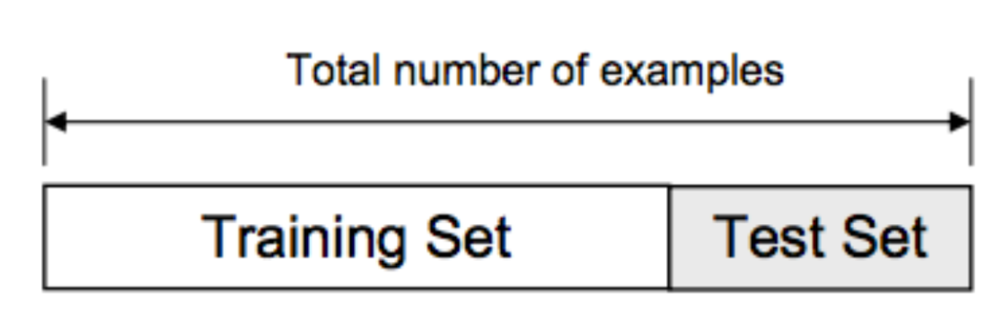

In [65]:
X_train,X_test,y_train,y_test = train_test_split(X_standardized,Y,test_size=0.3,random_state=50, stratify=Y)

In [66]:
X_train.shape

(361, 18)

- ### Keras is an API designed for human beings, not machines. 
- ### Keras follows best practices for reducing cognitive load: it offers consistent & simple APIs, it minimizes the number of user actions required for common use cases, and it provides clear and actionable feedback upon user error.

In [67]:
!pip install tensorflow
!pip install keras

In [68]:
#Importing the necessary packages
import tensorflow as tf
import keras
from sklearn.model_selection import GridSearchCV, KFold
from keras.models import Sequential
from keras.layers import Dense
from keras.wrappers.scikit_learn import KerasClassifier
from keras.optimizers import Adam

In [69]:
X_train

array([[ 2.14938984,  0.83066274,  0.71844119, ..., -0.04402255,
        -0.17285971, -0.70608125],
       [ 0.17391177,  0.97552234, -0.14036597, ..., -0.04402255,
        -0.17285971,  1.41626761],
       [-1.67497317, -2.17345911,  2.06799529, ..., -0.04402255,
        -0.17285971, -0.70608125],
       ...,
       [-0.03863967,  0.87182062, -0.56976954, ..., -0.04402255,
        -0.17285971,  1.41626761],
       [ 0.56931996,  0.2685752 , -0.0790226 , ..., -0.04402255,
        -0.17285971, -0.70608125],
       [ 2.54636091,  1.09415388,  1.69993508, ..., -0.04402255,
        -0.17285971, -0.70608125]])

In [70]:
y_train

,size_category
454,0
360,0
104,0
125,0
327,0
...,...
42,0
365,1
338,1
73,0


## Tuning of Hyperparameters : Batch Size and Epochs

The batch size is a number of samples processed before the model is updated. The number of epochs is the number of complete passes through the training dataset. The size of a batch must be more than or equal to one and less than or equal to the number of samples in the training dataset.

In [71]:
def create_model():
    model1 = Sequential()
    model1.add(Dense(12,input_dim=18,activation='relu'))
    model1.add(Dense(8,activation='relu'))
    model1.add(Dense(4,activation="relu"))
    model1.add(Dense(units=1,activation="sigmoid"))
    
    adam=Adam(learning_rate=0.01)
    model1.compile(loss='binary_crossentropy',optimizer = adam,metrics=["accuracy"])
    return model1

In [72]:
model1 =KerasClassifier(build_fn=create_model,verbose=0)
batch_size=[10,20,40,50]
epochs=[10,50,100,200]
param_grid=dict(batch_size=batch_size,epochs=epochs)
grid = GridSearchCV(estimator=model1,param_grid=param_grid,cv=KFold(),verbose=10)

In [73]:
grid_result = grid.fit(X_test,y_test)

Fitting 5 folds for each of 16 candidates, totalling 80 fits
[CV 1/5; 1/16] START batch_size=10, epochs=10...................................
[CV 1/5; 1/16] END ....batch_size=10, epochs=10;, score=0.875 total time=   1.3s
[CV 2/5; 1/16] START batch_size=10, epochs=10...................................
[CV 2/5; 1/16] END ....batch_size=10, epochs=10;, score=0.710 total time=   0.8s
[CV 3/5; 1/16] START batch_size=10, epochs=10...................................
[CV 3/5; 1/16] END ....batch_size=10, epochs=10;, score=0.806 total time=   1.0s
[CV 4/5; 1/16] START batch_size=10, epochs=10...................................
[CV 4/5; 1/16] END ....batch_size=10, epochs=10;, score=0.839 total time=   1.0s
[CV 5/5; 1/16] START batch_size=10, epochs=10...................................
[CV 5/5; 1/16] END ....batch_size=10, epochs=10;, score=0.903 total time=   0.8s
[CV 1/5; 2/16] START batch_size=10, epochs=50...................................
[CV 1/5; 2/16] END ....batch_size=10, epochs=50;

[CV 3/5; 9/16] END ....batch_size=40, epochs=10;, score=0.742 total time=   0.8s
[CV 4/5; 9/16] START batch_size=40, epochs=10...................................
[CV 4/5; 9/16] END ....batch_size=40, epochs=10;, score=0.710 total time=   1.2s
[CV 5/5; 9/16] START batch_size=40, epochs=10...................................
[CV 5/5; 9/16] END ....batch_size=40, epochs=10;, score=0.774 total time=   1.1s
[CV 1/5; 10/16] START batch_size=40, epochs=50..................................
[CV 1/5; 10/16] END ...batch_size=40, epochs=50;, score=0.906 total time=   1.1s
[CV 2/5; 10/16] START batch_size=40, epochs=50..................................
[CV 2/5; 10/16] END ...batch_size=40, epochs=50;, score=0.871 total time=   0.9s
[CV 3/5; 10/16] START batch_size=40, epochs=50..................................
[CV 3/5; 10/16] END ...batch_size=40, epochs=50;, score=0.871 total time=   0.9s
[CV 4/5; 10/16] START batch_size=40, epochs=50..................................
[CV 4/5; 10/16] END ...batch

In [74]:
#Summarize the results

print('Best {}, using {}'.format(grid_result.best_score_,grid_result.best_params_))
means = grid_result.cv_results_["mean_test_score"]
stds = grid_result.cv_results_["std_test_score"]
params = grid_result.cv_results_["params"]
for mean,stdev,param in zip(means,stds,params):
    print("{},{} with {}".format(mean,stdev,param))

Best 0.9163306474685669, using {'batch_size': 10, 'epochs': 100}
0.8266128897666931,0.06698890209716148 with {'batch_size': 10, 'epochs': 10}
0.9036290168762207,0.04591111247360459 with {'batch_size': 10, 'epochs': 50}
0.9163306474685669,0.038979651889110165 with {'batch_size': 10, 'epochs': 100}
0.9163306355476379,0.05261285746853071 with {'batch_size': 10, 'epochs': 200}
0.743749988079071,0.03950996229754588 with {'batch_size': 20, 'epochs': 10}
0.8715725660324096,0.029545755501383785 with {'batch_size': 20, 'epochs': 50}
0.8846774220466613,0.025451183134565868 with {'batch_size': 20, 'epochs': 100}
0.9038306474685669,0.02887783662448387 with {'batch_size': 20, 'epochs': 200}
0.7245967626571655,0.030271488424157823 with {'batch_size': 40, 'epochs': 10}
0.8844758033752441,0.0332728556248805 with {'batch_size': 40, 'epochs': 50}
0.8651209473609924,0.03236123207369386 with {'batch_size': 40, 'epochs': 100}
0.910080635547638,0.0379032367087433 with {'batch_size': 40, 'epochs': 200}
0.763

## Tuning of Hyperparameters : Learning rate and Drop out rate

- **Learning rate dropout (LRD)** is a new gradient descent technique to motivate faster convergence and better generalization. LRD aids the optimizer to actively explore in the parameter space by randomly dropping some learning rates (to 0); at each iteration, only parameters whose learning rate is not 0 are updated.

In [75]:
from keras.layers import Dropout
from keras.optimizers import adam_v2

#Defining the model
def create_model(dropout_rate,learning_rate):
    model2 = Sequential()
    model2.add(Dense(12,input_dim=18,activation='relu'))
    model2.add(Dense(8,activation='relu'))
    model2.add(Dense(4,activation='relu'))
    model2.add(Dense(units=1,activation="sigmoid"))
    
    adam=Adam(lr=0.01)
    model2.compile(loss='binary_crossentropy',optimizer = adam,metrics=["accuracy"])
    return model2

In [76]:
model2=KerasClassifier(build_fn=create_model,batch_size=10,epochs=100,verbose=0)
dropout_rate=[0.0,0.1,0.2,0.3,0.4,0.5]
learning_rate = [0.001,0.01,0.1]
param_grid=dict(dropout_rate=dropout_rate,learning_rate = learning_rate)
grid2 = GridSearchCV(estimator=model2,param_grid=param_grid,cv=KFold(),verbose=10)

In [77]:
grid_result2 = grid2.fit(X_test,y_test)

Fitting 5 folds for each of 18 candidates, totalling 90 fits
[CV 1/5; 1/18] START dropout_rate=0.0, learning_rate=0.001......................
[CV 1/5; 1/18] END dropout_rate=0.0, learning_rate=0.001;, score=1.000 total time=   1.9s
[CV 2/5; 1/18] START dropout_rate=0.0, learning_rate=0.001......................
[CV 2/5; 1/18] END dropout_rate=0.0, learning_rate=0.001;, score=0.839 total time=   2.2s
[CV 3/5; 1/18] START dropout_rate=0.0, learning_rate=0.001......................
[CV 3/5; 1/18] END dropout_rate=0.0, learning_rate=0.001;, score=0.903 total time=   3.1s
[CV 4/5; 1/18] START dropout_rate=0.0, learning_rate=0.001......................
[CV 4/5; 1/18] END dropout_rate=0.0, learning_rate=0.001;, score=0.903 total time=   2.8s
[CV 5/5; 1/18] START dropout_rate=0.0, learning_rate=0.001......................
[CV 5/5; 1/18] END dropout_rate=0.0, learning_rate=0.001;, score=0.903 total time=   2.1s
[CV 1/5; 2/18] START dropout_rate=0.0, learning_rate=0.01.......................
[CV

[CV 4/5; 10/18] END dropout_rate=0.3, learning_rate=0.001;, score=0.806 total time=   2.2s
[CV 5/5; 10/18] START dropout_rate=0.3, learning_rate=0.001.....................
[CV 5/5; 10/18] END dropout_rate=0.3, learning_rate=0.001;, score=0.871 total time=   1.9s
[CV 1/5; 11/18] START dropout_rate=0.3, learning_rate=0.01......................
[CV 1/5; 11/18] END dropout_rate=0.3, learning_rate=0.01;, score=1.000 total time=   1.9s
[CV 2/5; 11/18] START dropout_rate=0.3, learning_rate=0.01......................
[CV 2/5; 11/18] END dropout_rate=0.3, learning_rate=0.01;, score=0.839 total time=   1.9s
[CV 3/5; 11/18] START dropout_rate=0.3, learning_rate=0.01......................
[CV 3/5; 11/18] END dropout_rate=0.3, learning_rate=0.01;, score=0.903 total time=   1.9s
[CV 4/5; 11/18] START dropout_rate=0.3, learning_rate=0.01......................
[CV 4/5; 11/18] END dropout_rate=0.3, learning_rate=0.01;, score=0.935 total time=   1.9s
[CV 5/5; 11/18] START dropout_rate=0.3, learning_rate

In [78]:
#Summarize the results
print('Best {}, using {}'.format(grid_result2.best_score_,grid_result2.best_params_))
means = grid_result2.cv_results_["mean_test_score"]
stds = grid_result2.cv_results_["std_test_score"]
params = grid_result2.cv_results_["params"]
for mean,stdev,param in zip(means,stds,params):
    print("{},{} with {}".format(mean,stdev,param))

Best 0.9229838609695434, using {'dropout_rate': 0.2, 'learning_rate': 0.1}
0.9096773982048034,0.05161291211843524 with {'dropout_rate': 0.0, 'learning_rate': 0.001}
0.9100806236267089,0.04304518338978399 with {'dropout_rate': 0.0, 'learning_rate': 0.01}
0.8907258033752441,0.03918558892301594 with {'dropout_rate': 0.0, 'learning_rate': 0.1}
0.8844757914543152,0.026284014318176452 with {'dropout_rate': 0.1, 'learning_rate': 0.001}
0.9165322542190552,0.038919115028959256 with {'dropout_rate': 0.1, 'learning_rate': 0.01}
0.8778225660324097,0.0692281309765951 with {'dropout_rate': 0.1, 'learning_rate': 0.1}
0.9163306355476379,0.05261285746853071 with {'dropout_rate': 0.2, 'learning_rate': 0.001}
0.9036290287971497,0.02931093723828088 with {'dropout_rate': 0.2, 'learning_rate': 0.01}
0.9229838609695434,0.03306451047339367 with {'dropout_rate': 0.2, 'learning_rate': 0.1}
0.8588709712028504,0.02625616101159362 with {'dropout_rate': 0.3, 'learning_rate': 0.001}
0.9225806355476379,0.052413161174

## Tuning of Hyperparameters : Activation Function and Kernel Initializer

- The activation function compares the input value to a threshold value. If the input value is greater than the threshold value, the neuron is activated. Kernel Initializers are also known as weight initializers as their main task is to initialize the weights of a neural network

In [79]:
#Defining the model

def create_model(activation_function,init):
    model3 = Sequential()
    model3.add(Dense(12,input_dim=18,activation='relu'))
    model3.add(Dropout(0.01))
    model3.add(Dense(8,activation='relu'))
    model3.add(Dropout(0.01))
    model3.add(Dense(4,activation="relu"))
    model3.add(Dropout(0.01))
    model3.add(Dense(units=1,activation="sigmoid"))
    
    adam=Adam(lr=0.01)
    model3.compile(loss='binary_crossentropy',optimizer = adam,metrics=["accuracy"])
    return model3


In [80]:
#Create the model

model3=KerasClassifier(build_fn=create_model,batch_size=10,epochs=100,verbose=0)
activation_function=['softmax','tanh','relu']
init=['normal','uniform','zero']
param_grid=dict(activation_function=activation_function,init=init)
grid3 = GridSearchCV(estimator=model3,param_grid=param_grid,cv=KFold(),verbose=10)

In [81]:
grid_result3 = grid3.fit(X_test,y_test)

Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV 1/5; 1/9] START activation_function=softmax, init=normal....................
[CV 1/5; 1/9] END activation_function=softmax, init=normal;, score=0.969 total time=   2.3s
[CV 2/5; 1/9] START activation_function=softmax, init=normal....................
[CV 2/5; 1/9] END activation_function=softmax, init=normal;, score=0.871 total time=   2.1s
[CV 3/5; 1/9] START activation_function=softmax, init=normal....................
[CV 3/5; 1/9] END activation_function=softmax, init=normal;, score=0.871 total time=   2.6s
[CV 4/5; 1/9] START activation_function=softmax, init=normal....................
[CV 4/5; 1/9] END activation_function=softmax, init=normal;, score=0.903 total time=   2.5s
[CV 5/5; 1/9] START activation_function=softmax, init=normal....................
[CV 5/5; 1/9] END activation_function=softmax, init=normal;, score=0.871 total time=   2.7s
[CV 1/5; 2/9] START activation_function=softmax, init=uniform..............

In [82]:
#Summarize the results
print('Best {}, using {}'.format(grid_result3.best_score_,grid_result3.best_params_))
means = grid_result3.cv_results_["mean_test_score"]
stds = grid_result3.cv_results_["std_test_score"]
params = grid_result3.cv_results_["params"]
for mean,stdev,param in zip(means,stds,params):
    print("{},{} with {}".format(mean,stdev,param))

Best 0.9356854677200317, using {'activation_function': 'tanh', 'init': 'zero'}
0.8969758033752442,0.03799961758384321 with {'activation_function': 'softmax', 'init': 'normal'}
0.910080635547638,0.04763528855112984 with {'activation_function': 'softmax', 'init': 'uniform'}
0.9036290287971497,0.05793555615528261 with {'activation_function': 'softmax', 'init': 'zero'}
0.8844757914543152,0.026284014318176452 with {'activation_function': 'tanh', 'init': 'normal'}
0.9036290287971497,0.02931093723828088 with {'activation_function': 'tanh', 'init': 'uniform'}
0.9356854677200317,0.029079827806001005 with {'activation_function': 'tanh', 'init': 'zero'}
0.9163306355476379,0.060004817584543194 with {'activation_function': 'relu', 'init': 'normal'}
0.9098790168762207,0.05184079028729416 with {'activation_function': 'relu', 'init': 'uniform'}
0.903830635547638,0.03535764835710232 with {'activation_function': 'relu', 'init': 'zero'}


## Tuning of Hyperparameter : Number of Neurons in activation layer

- The number of neurons range is set to be from 10 to 100. An activation function is a parameter in each layer. Input data are fed to the input layer, followed by hidden layers, and the final output layer

In [83]:
#Defining the model

def create_model(neuron1,neuron2,neuron3):
    model4 = Sequential()
    model4.add(Dense(neuron1,input_dim = 18,kernel_initializer = 'uniform',activation = 'linear'))
    model4.add(Dropout(0.2))
    model4.add(Dense(neuron2,input_dim = neuron1,kernel_initializer = 'uniform',activation = 'linear'))
    model4.add(Dropout(0.2))
    model4.add(Dense(1,activation = 'sigmoid'))
    
    adam = adam_v2.Adam(lr = 0.01)
    model4.compile(loss = 'binary_crossentropy',optimizer = adam,metrics = ['accuracy'])
    return model4


In [84]:
#Create the model

model4=KerasClassifier(build_fn=create_model,batch_size=10,epochs=100,verbose=0)
neuron1 = [8,16,24]
neuron2 = [4,8,16]
neuron3 = [2,4,8]
param_grid=dict(neuron1 = neuron1,neuron2 = neuron2,neuron3 = neuron3)
grid4 = GridSearchCV(estimator=model4,param_grid=param_grid,cv=KFold(),verbose=10)


In [85]:
grid_result4 = grid4.fit(X_test,y_test)

Fitting 5 folds for each of 27 candidates, totalling 135 fits
[CV 1/5; 1/27] START neuron1=8, neuron2=4, neuron3=2............................
[CV 1/5; 1/27] END neuron1=8, neuron2=4, neuron3=2;, score=0.938 total time=   1.9s
[CV 2/5; 1/27] START neuron1=8, neuron2=4, neuron3=2............................
[CV 2/5; 1/27] END neuron1=8, neuron2=4, neuron3=2;, score=0.903 total time=   2.1s
[CV 3/5; 1/27] START neuron1=8, neuron2=4, neuron3=2............................
[CV 3/5; 1/27] END neuron1=8, neuron2=4, neuron3=2;, score=0.935 total time=   1.9s
[CV 4/5; 1/27] START neuron1=8, neuron2=4, neuron3=2............................
[CV 4/5; 1/27] END neuron1=8, neuron2=4, neuron3=2;, score=0.968 total time=   2.1s
[CV 5/5; 1/27] START neuron1=8, neuron2=4, neuron3=2............................
[CV 5/5; 1/27] END neuron1=8, neuron2=4, neuron3=2;, score=1.000 total time=   1.9s
[CV 1/5; 2/27] START neuron1=8, neuron2=4, neuron3=4............................
[CV 1/5; 2/27] END neuron1=8, ne

[CV 5/5; 10/27] END neuron1=16, neuron2=4, neuron3=2;, score=1.000 total time=   2.3s
[CV 1/5; 11/27] START neuron1=16, neuron2=4, neuron3=4..........................
[CV 1/5; 11/27] END neuron1=16, neuron2=4, neuron3=4;, score=0.969 total time=   1.9s
[CV 2/5; 11/27] START neuron1=16, neuron2=4, neuron3=4..........................
[CV 2/5; 11/27] END neuron1=16, neuron2=4, neuron3=4;, score=0.903 total time=   1.9s
[CV 3/5; 11/27] START neuron1=16, neuron2=4, neuron3=4..........................
[CV 3/5; 11/27] END neuron1=16, neuron2=4, neuron3=4;, score=0.968 total time=   2.0s
[CV 4/5; 11/27] START neuron1=16, neuron2=4, neuron3=4..........................
[CV 4/5; 11/27] END neuron1=16, neuron2=4, neuron3=4;, score=0.935 total time=   2.0s
[CV 5/5; 11/27] START neuron1=16, neuron2=4, neuron3=4..........................
[CV 5/5; 11/27] END neuron1=16, neuron2=4, neuron3=4;, score=1.000 total time=   1.9s
[CV 1/5; 12/27] START neuron1=16, neuron2=4, neuron3=8.........................

[CV 4/5; 20/27] END neuron1=24, neuron2=4, neuron3=4;, score=0.903 total time=   1.9s
[CV 5/5; 20/27] START neuron1=24, neuron2=4, neuron3=4..........................
[CV 5/5; 20/27] END neuron1=24, neuron2=4, neuron3=4;, score=1.000 total time=   1.9s
[CV 1/5; 21/27] START neuron1=24, neuron2=4, neuron3=8..........................
[CV 1/5; 21/27] END neuron1=24, neuron2=4, neuron3=8;, score=0.969 total time=   2.2s
[CV 2/5; 21/27] START neuron1=24, neuron2=4, neuron3=8..........................
[CV 2/5; 21/27] END neuron1=24, neuron2=4, neuron3=8;, score=0.871 total time=   1.9s
[CV 3/5; 21/27] START neuron1=24, neuron2=4, neuron3=8..........................
[CV 3/5; 21/27] END neuron1=24, neuron2=4, neuron3=8;, score=0.903 total time=   1.9s
[CV 4/5; 21/27] START neuron1=24, neuron2=4, neuron3=8..........................
[CV 4/5; 21/27] END neuron1=24, neuron2=4, neuron3=8;, score=0.968 total time=   1.9s
[CV 5/5; 21/27] START neuron1=24, neuron2=4, neuron3=8.........................

In [86]:
#Summarize the results
print('Best {}, using {}'.format(grid_result4.best_score_,grid_result4.best_params_))
means = grid_result4.cv_results_["mean_test_score"]
stds = grid_result4.cv_results_["std_test_score"]
params = grid_result4.cv_results_["params"]
for mean,stdev,param in zip(means,stds,params):
    print("{},{} with {}".format(mean,stdev,param))

Best 0.96794353723526, using {'neuron1': 8, 'neuron2': 16, 'neuron3': 4}
0.9487903118133545,0.032748295132115426 with {'neuron1': 8, 'neuron2': 4, 'neuron3': 2}
0.935887086391449,0.045626918602768914 with {'neuron1': 8, 'neuron2': 4, 'neuron3': 4}
0.9487903118133545,0.032748295132115426 with {'neuron1': 8, 'neuron2': 4, 'neuron3': 8}
0.9550403118133545,0.032978355574424925 with {'neuron1': 8, 'neuron2': 8, 'neuron3': 2}
0.9485887050628662,0.0438479056228078 with {'neuron1': 8, 'neuron2': 8, 'neuron3': 4}
0.9487903118133545,0.032748295132115426 with {'neuron1': 8, 'neuron2': 8, 'neuron3': 8}
0.9550403118133545,0.032978355574424925 with {'neuron1': 8, 'neuron2': 16, 'neuron3': 2}
0.96794353723526,0.035339249593106664 with {'neuron1': 8, 'neuron2': 16, 'neuron3': 4}
0.9552419185638428,0.032668760771603605 with {'neuron1': 8, 'neuron2': 16, 'neuron3': 8}
0.9487903118133545,0.032748295132115426 with {'neuron1': 16, 'neuron2': 4, 'neuron3': 2}
0.9550403118133545,0.032978355574424925 with {'n

In [87]:
def toFindBestParams(X_train, y_train, X_test, y_test):
    #print(y_test.shape)
    #sys.exit()
    
    #Defining list of hyperparameters
    batch_size_list = [5 , 10 , 15 , 20]
    epoch_list      = [5 , 10 , 50 , 100]
           
    #Initializing the trials
    for batch_trial in batch_size_list:
        for epochs_trial in epoch_list:
            
            #Create ANN model
            model = Sequential()
            
            #Defining the first layer of the model
            model.add(Dense(units=50, input_dim=X_train.shape[1], kernel_initializer='normal', activation='tanh'))
            
            #Defining the Second layer of the model
            model.add(Dense(units=6, kernel_initializer='normal', activation='tanh'))
 
            #The output neuron is a single fully connected node 
            #Since we will be predicting a single number
            model.add(Dense(1, kernel_initializer='normal', activation='sigmoid'))
 
            #Compiling the model
            model.compile(loss='binary_crossentropy', optimizer='adam',  metrics=['accuracy'])
 
            #Fitting the ANN to the Training set
            model_trained = model.fit(X_train, y_train ,batch_size = batch_trial, epochs = epochs_trial, verbose=0)
               
            #Fetching the accuracy of the training
            Accuracy_train = model_trained.history['accuracy'][-1]   
            
            #Printing the results of the current iteration
            print('batch_size:', batch_trial,'-', 'epochs:',epochs_trial, 'Accuracy:',Accuracy_train)

#Calling the function
toFindBestParams(X_train, y_train, X_test, y_test)

batch_size: 5 - epochs: 5 Accuracy: 0.81717449426651
batch_size: 5 - epochs: 10 Accuracy: 0.9113573431968689
batch_size: 5 - epochs: 50 Accuracy: 0.9722991585731506
batch_size: 5 - epochs: 100 Accuracy: 0.9806094169616699
batch_size: 10 - epochs: 5 Accuracy: 0.7811634540557861
batch_size: 10 - epochs: 10 Accuracy: 0.8559556603431702
batch_size: 10 - epochs: 50 Accuracy: 0.9750692248344421
batch_size: 10 - epochs: 100 Accuracy: 0.9833794832229614
batch_size: 15 - epochs: 5 Accuracy: 0.7783933281898499
batch_size: 15 - epochs: 10 Accuracy: 0.81717449426651
batch_size: 15 - epochs: 50 Accuracy: 0.9778393507003784
batch_size: 15 - epochs: 100 Accuracy: 0.9750692248344421
batch_size: 20 - epochs: 5 Accuracy: 0.7562326788902283
batch_size: 20 - epochs: 10 Accuracy: 0.7894737124443054
batch_size: 20 - epochs: 50 Accuracy: 0.9667590260505676
batch_size: 20 - epochs: 100 Accuracy: 0.9778393507003784


## Training model with Optimum values of Hyperparameters

- The hyperparameter optimization was carried out by taking 2 hyperparameters at once. We may have missed the best values. The performance can be further improved by finding the optimum values of hyperparameters all at once given by the code snippet below.

In [88]:
#create ANN model

model = Sequential()
model.add(Dense(24,input_dim = 18,kernel_initializer = 'normal',activation='relu'))
model.add(Dropout(0.2))
model.add(Dense(8,input_dim = 18,kernel_initializer = 'normal',activation='relu'))
model.add(Dropout(0.2))
model.add(Dense(8,input_dim = 18,kernel_initializer = 'normal',activation='relu'))
model.add(Dropout(0.2))
model.add(Dense(1, kernel_initializer='normal',activation = 'sigmoid'))
    
adam = adam_v2.Adam(lr = 0.01)
model.compile(loss = 'binary_crossentropy',optimizer = adam,metrics = ['accuracy'])

In [89]:
model.summary()

Model: "sequential_370"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_1328 (Dense)          (None, 24)                456       
                                                                 
 dropout_410 (Dropout)       (None, 24)                0         
                                                                 
 dense_1329 (Dense)          (None, 8)                 200       
                                                                 
 dropout_411 (Dropout)       (None, 8)                 0         
                                                                 
 dense_1330 (Dense)          (None, 8)                 72        
                                                                 
 dropout_412 (Dropout)       (None, 8)                 0         
                                                                 
 dense_1331 (Dense)          (None, 1)              

In [90]:
#Training the model with best parameters
history = model.fit(X_train, y_train, validation_split=0.3, batch_size = 20, epochs = 100)

Epoch 1/100
13/13 [==============================] - 1s 15ms/step - loss: 0.6741 - accuracy: 0.7024 - val_loss: 0.6074 - val_accuracy: 0.7982
Epoch 2/100
13/13 [==============================] - 0s 4ms/step - loss: 0.6053 - accuracy: 0.7024 - val_loss: 0.5029 - val_accuracy: 0.7982
Epoch 3/100
13/13 [==============================] - 0s 4ms/step - loss: 0.5773 - accuracy: 0.7024 - val_loss: 0.4822 - val_accuracy: 0.7982
Epoch 4/100
13/13 [==============================] - 0s 4ms/step - loss: 0.5733 - accuracy: 0.7024 - val_loss: 0.4785 - val_accuracy: 0.7982
Epoch 5/100
13/13 [==============================] - 0s 4ms/step - loss: 0.5330 - accuracy: 0.7024 - val_loss: 0.4377 - val_accuracy: 0.7982
Epoch 6/100
13/13 [==============================] - 0s 6ms/step - loss: 0.5272 - accuracy: 0.7024 - val_loss: 0.4308 - val_accuracy: 0.7982
Epoch 7/100
13/13 [==============================] - 0s 7ms/step - loss: 0.5080 - accuracy: 0.7024 - val_loss: 0.3975 - val_accuracy: 0.7982
Epoch 8/100


Epoch 59/100
13/13 [==============================] - 0s 5ms/step - loss: 0.1156 - accuracy: 0.9603 - val_loss: 0.1337 - val_accuracy: 0.9633
Epoch 60/100
13/13 [==============================] - 0s 5ms/step - loss: 0.1283 - accuracy: 0.9722 - val_loss: 0.1865 - val_accuracy: 0.9358
Epoch 61/100
13/13 [==============================] - 0s 4ms/step - loss: 0.1027 - accuracy: 0.9643 - val_loss: 0.1256 - val_accuracy: 0.9450
Epoch 62/100
13/13 [==============================] - 0s 4ms/step - loss: 0.0694 - accuracy: 0.9841 - val_loss: 0.1178 - val_accuracy: 0.9541
Epoch 63/100
13/13 [==============================] - 0s 6ms/step - loss: 0.0947 - accuracy: 0.9722 - val_loss: 0.1632 - val_accuracy: 0.9266
Epoch 64/100
13/13 [==============================] - 0s 5ms/step - loss: 0.0951 - accuracy: 0.9722 - val_loss: 0.2232 - val_accuracy: 0.9358
Epoch 65/100
13/13 [==============================] - 0s 5ms/step - loss: 0.0671 - accuracy: 0.9841 - val_loss: 0.1058 - val_accuracy: 0.9358
Epoch 

In [91]:
model.weights

[<tf.Variable 'dense_1328/kernel:0' shape=(18, 24) dtype=float32, numpy=
 array([[ 8.82542506e-03, -5.28968424e-02, -1.19680718e-01,
          1.50594205e-01,  1.06409468e-01, -5.95947728e-02,
         -8.56742561e-02,  2.33127922e-01, -1.88115731e-01,
          9.22470633e-03,  2.31336102e-01,  3.56133021e-02,
         -1.15657803e-02,  2.87454631e-02,  1.35095008e-02,
         -7.18196332e-01,  1.32327512e-01,  8.76351744e-02,
          1.10185310e-01, -1.48014398e-02, -3.78986865e-01,
         -1.29633710e-01,  2.74752472e-02,  1.84481926e-02],
        [ 1.22057758e-01,  2.67670184e-01, -1.41702160e-01,
          1.55916348e-01,  2.03653723e-01, -2.80871987e-02,
          2.13054463e-01, -1.09131886e-02,  5.37179112e-02,
          1.31808296e-01,  3.94656062e-02,  1.66595429e-01,
          3.15992348e-02,  3.74920666e-03, -2.28114054e-01,
          7.26465359e-02,  8.64571556e-02,  1.61065400e-01,
         -2.16168910e-02, -1.70283929e-01,  1.37701586e-01,
          2.17661299e-02, 

In [92]:
#Evaluate the model
scores = model.evaluate(X_standardized,Y)
print("%s: %.2f%%" % (model.metrics_names[1], scores[1]*100))

17/17 [==============================] - 0s 1ms/step - loss: 0.5500 - accuracy: 0.9632
accuracy: 96.32%


In [93]:
#List all data in history
history.history.keys()

dict_keys(['loss', 'accuracy', 'val_loss', 'val_accuracy'])

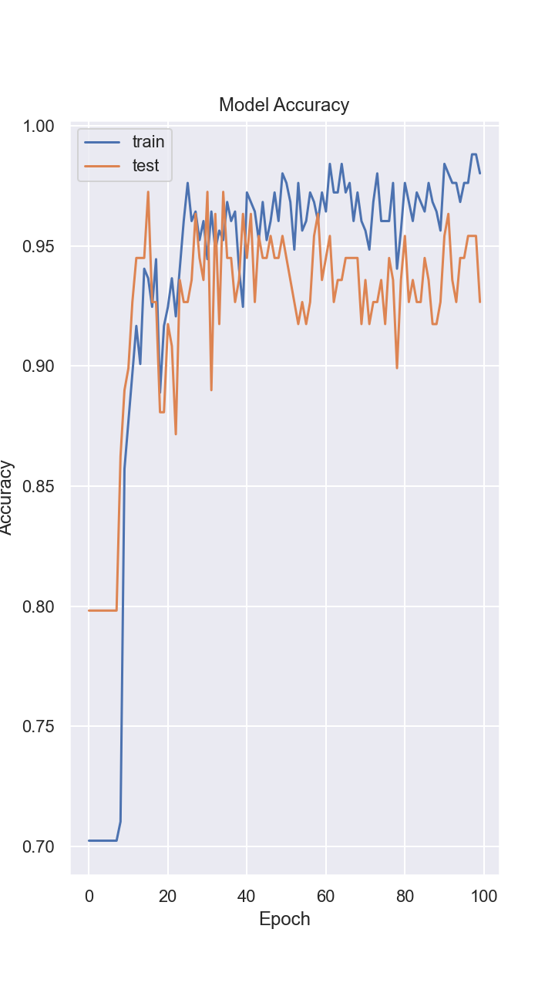

In [94]:
#Summarize history for accuracy
plt.plot(history.history['accuracy'])
plt.plot(history.history['val_accuracy'])
plt.title('Model Accuracy')
plt.ylabel('Accuracy')
plt.xlabel('Epoch')
plt.legend(['train', 'test'], loc='upper left')
plt.show()

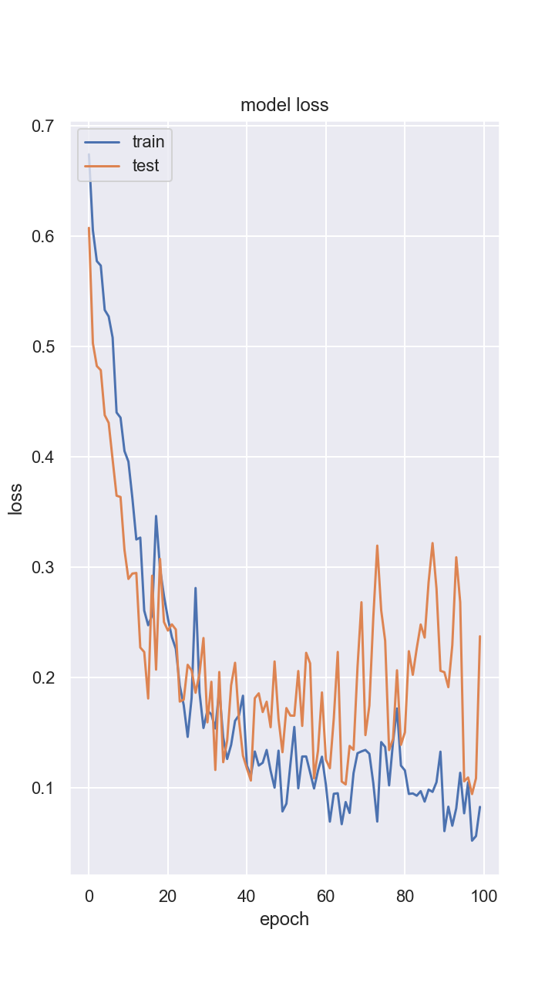

In [95]:
#Summarize history for loss
plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.title('model loss')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.legend(['train', 'test'], loc='upper left')
plt.show()

- The training-error converged but the testing error didn't converge and conincide with the training error . Hence, We can do better with Hyperparameter Tuning all the parameters which is computationally Expensive.

## Predicting values from Model using same dataset

In [96]:
#Generating predictions for test data
y_predict_test = model.predict(X_test) 

#Creating table with test price & predicted price for test
test_prediction = pd.DataFrame()
test_prediction['Test_Actual'] = y_test.size_category
test_prediction['Test_Probability'] = y_predict_test
def probToBinary(varProb):
    if varProb >= 0.5:
        return 1
    else:
        return 0

#Converting the probability of target variable to binary class of test data
test_prediction['Test_Predicted'] = test_prediction['Test_Probability'].apply(probToBinary)
print(test_prediction.shape)
test_prediction.head(10)

5/5 [==============================] - 0s 998us/step
(156, 3)


,Test_Actual,Test_Probability,Test_Predicted
220,1,9.403497e-01,1
71,0,7.838133e-10,0
379,0,0.000000e+00,0
393,0,3.550391e-18,0
330,1,8.806231e-01,1
6,0,3.832261e-10,0
485,0,3.074429e-07,0
308,0,1.487614e-10,0
95,0,5.725704e-13,0
460,0,1.963402e-08,0


In [97]:
#Generating predictions for train data
y_predict_train = model.predict(X_train)

#Creating table with test price & predicted price for test
train_prediction = pd.DataFrame()
train_prediction['Train_Actual'] = y_train.size_category
train_prediction['Train_Probability'] = y_predict_train
train_prediction['Train_Predicted'] = train_prediction['Train_Probability'].apply(probToBinary)
print(train_prediction.shape)
train_prediction.head(10)

12/12 [==============================] - 0s 1ms/step
(361, 3)


,Train_Actual,Train_Probability,Train_Predicted
454,0,7.761336e-11,0
360,0,6.329168e-08,0
104,0,0.000000e+00,0
125,0,4.692078e-06,0
327,0,2.261641e-09,0
169,0,1.289469e-08,0
333,0,2.690269e-06,0
453,0,2.770074e-10,0
477,1,9.341294e-01,1
201,1,9.403497e-01,1


## Classification Report

### Test Data

In [98]:
from sklearn.metrics import accuracy_score, confusion_matrix, classification_report
print("Classification Report for Test Data  =\n", classification_report(test_prediction['Test_Actual'],test_prediction['Test_Predicted']))

Classification Report for Test Data  =
               precision    recall  f1-score   support

           0       0.93      0.99      0.96       114
           1       0.97      0.81      0.88        42

    accuracy                           0.94       156
   macro avg       0.95      0.90      0.92       156
weighted avg       0.94      0.94      0.94       156



### Train Data

In [99]:
print("Classification Report for Train Data  =\n", classification_report(train_prediction['Train_Actual'],train_prediction['Train_Predicted']))

Classification Report for Train Data  =
               precision    recall  f1-score   support

           0       0.98      0.98      0.98       264
           1       0.95      0.95      0.95        97

    accuracy                           0.97       361
   macro avg       0.96      0.96      0.96       361
weighted avg       0.97      0.97      0.97       361



### Training and Test set


In [100]:
y_predict_test = model.predict(X_test) 
y_predict_train = model.predict(X_train)
print('Training set score: {:.2f}%'.format(accuracy_score(train_prediction['Train_Actual'], train_prediction['Train_Predicted'])*100))

print('Test set score: {:.2f}%'.format(accuracy_score(test_prediction['Test_Actual'], test_prediction['Test_Predicted'])*100))

12/12 [==============================] - 0s 983us/step
Training set score: 97.23%
Test set score: 94.23%


# Insights:

- We have Predict the Burned Area of Forest Fire with Neural Networks.
- We have used **Model Validation techniques, Feature Engineering**
- We did optimization for getting more accuracy.
- Firstly, we tunned **Hypermeters** separately for checking which are the best scores and best parameters
- Then, finally **we trained model with Optimum values of Hyperparameters**
- We got the **Train Accuracy :  97.23%** and **Test Accuracy :  94.23%**